Take this dataset: https://www.kaggle.com/felipeesc/shark-attack-dataset. Use all the skills you've learned up until now to answer the following questions as well as possible.

1.   what are the most dangerous types of sharks to humans?
2.   are children more likely to be attacked by sharks?
3.   are shark attacks where sharks were provoked more or less dangerous?
4.   are certain activities more likely to result in a shark attack?

If you feel you can't answer a question based on the dataset alone, feel free to find other datasets and use them in answering the questions.

For each answer you give not only answer the question but also write about the assumptions you made in answering the question. If an assumption or decision possibly created a bias please write about this as well.

# Inlezen Dataframe

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
%load_ext google.colab.data_table

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [ ]:
# inlezen dataframe
df = pd.read_csv("attacks.csv", encoding='cp1252')

In [ ]:
# Eventueel tweede methode, als encoden niet lukt:
# ⚠️PAS OP, BIJ DEZE METHODE HETEN DE KOLOMMEN SOMS NET UITS ANDERS:
# CSViewer gedownload attack.csv binnegehaald en weer geexporteerd (utf8)
# als attacks.CSViewer
# Standaard instellingen aangehouden
# df = pd.read_csv("attacks_CSViewer.csv")

# Deze methode verder niet gebruikt,
# omdat je toch verschillen hebt en het daardoor niet generiek is

# Dataframe bekijken en grof cleanen

In [ ]:
df.head(5)

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN


In [ ]:
 df.iloc[375:385]

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
375,2015.08.20,20-Aug-2015,2015.0,Unprovoked,USA,South Carolina,"Murrells Inlet, Georgetown County",Surfing,Dylan Peyton,M,...,4' shark,"C. Creswell, GSAF",2015.08.20-Peyton.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.08.20,2015.08.20,5928.0,NaN,NaN
376,2015.08.19,19-Aug-2015,2015.0,Unprovoked,USA,Florida,"Jacksonville Beach, Duval County",Walking,Kaley Szarmack,F,...,3' shark,"ABC News, 8/21/2015",2015.08.19-Szsarmack,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.08.19,2015.08.19,5927.0,NaN,NaN
377,2015.08.18.b,18-Aug-2015,2015.0,Boating,USA,California,Santa Barbara County,Kayak Fishing,Connor Lyon,M,...,"White shark, 13'","R. Collier, GSAF",2015.08.18.b-Lyon.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.08.18.b,2015.08.18.b,5926.0,NaN,NaN
378,2015.08.18.a,18-Aug-2015,2015.0,Invalid,SPAIN,Alicante,"Poniente Beach, Benidorm",Swimming,male,M,...,Shark involvement not confirmed,"The Local, 8/18/2015",2015.08.18.a-Benidorm.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.08.18.a,2015.08.18.a,5925.0,NaN,NaN
379,2015.08.10,10-Aug-2015,2015.0,Provoked,USA,California,Cortes Bank,Spearfishing,Richard Shafer,M,...,Hammerhead shark. 6' to 7',"NBC San Diego, 8/13/2015",2015.08.10-Shafer.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.08.10,2015.08.10,5924.0,NaN,NaN
380,2015.07.31,31-Jul-2015,2015.0,Unprovoked,AUSTRALIA,New South Wales,Evans Head,Surfing,Craig Ison,M,...,White shark,"Daily Telegraph, 7/31/2015",2015.07.31-Ison.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.31,2015.07.31,5923.0,NaN,NaN
381,2015.07.28,28-Jul-2015,2015.0,Unprovoked,COSTA RICA,Guanacaste,Playa Grande,Surfing,Thomas McCall,M,...,NaN,YouTube,2015.07.28-McCall.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.28,2015.07.28,5922.0,NaN,NaN
382,2015.07.27,27-Jul-2015,2015.0,NaN,AUSTRALIA,Victoria,Tyrendarra Beach,Surfing,male,M,...,NaN,NaN,2015.07.27-Victoria.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.27,2015.07.27,5921.0,NaN,NaN
383,2015.07.26.b,26-Jul-2015,2015.0,Unprovoked,USA,Florida,"Daytona Beach, Volusia County",Surfing,Shawn Warrilow,M,...,"Blacktip or spinner shark, 4'",CBS 7/27/2015,2015.07.26.b-Warrilow.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.26.b,2015.07.26.b,5920.0,NaN,NaN
384,2015.07.26.a,26-Jul-2015,2015.0,Invalid,USA,South Carolina,"Edisto Beach, Colleton County",Floating,female,F,...,"Thought to involve a 3' to 4' shark, but shark...","C. Creswell, GSAF, ABC 11, 7/27/2015",2015.07.26.a-Edisto.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.26.a,2015.07.26.a,5919.0,NaN,NaN


In [ ]:
df.tail()

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
25718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25722,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex ', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species ', 'Investigator or Source', 'pdf', 'href formula', 'href',
       'Case Number.1', 'Case Number.2', 'original order', 'Unnamed: 22',
       'Unnamed: 23'],
      dtype='object')

In [ ]:
# Verwijder spaties aan het eind of aan het begin van een kolom met strip:
df = df.rename(columns=lambda x: x.strip())

In [ ]:
df.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'pdf', 'href formula', 'href',
       'Case Number.1', 'Case Number.2', 'original order', 'Unnamed: 22',
       'Unnamed: 23'],
      dtype='object')

In [ ]:
# alle kolommen vanaf 'pdf' droppen (behalve original order), omdat je dan het aantal kolommen terugbrengt tot onder de 20
# df = df.drop('column_name', axis=1)
# Bij meerdere kolommen verwijderen gebruik een lijst

# Bij gebruik "attacks_CSViewer.csv" gebruik onderstaande lijst:
# remove = ['pdf', 'href formula', 'href',
      #  'Case Number(2)', 'Case Number(3)', 'Column 1',
      #  'Column 2']

# Bij gebruik "attacks.csv" gebruik onderstaande lijst:
remove = ['pdf', 'href formula', 'href',
       'Case Number.1', 'Case Number.2', 'Unnamed: 22',
       'Unnamed: 23']   
df2 = df.drop(remove, axis=1)
df2


,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,original order
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark,"R. Collier, GSAF",6303.0
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14h00 -15h00,NaN,"K.McMurray, TrackingSharks.com",6302.0
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN,"K.McMurray, TrackingSharks.com",6301.0
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,NaN,Minor injury to lower leg,N,NaN,2 m shark,"B. Myatt, GSAF",6300.0
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"Tiger shark, 3m",A .Kipper,6299.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Dropping rows
# Verwijder de rijen die minder dan 4 NON-NaN's hebben:
# Dat zijn er heel veel, ongeveer rij 6297 tm 25717
# Om onder de 20000 rijen uit te komen, voor de fijne view van data_table
# En om een goede inschatting te kunnen maken van het percentage missing-values per kolom

# Er zijn verschillende manieren:

# voorbeeld:
# df = df[df.isnull().sum(axis=1) < 7]
# This will keep only rows which have nan's less than 7 in the dataframe, and will remove all having nan's > 7.

# voorbeeld2:
# dropna has a thresh argument. Subtract your desired number from the number of columns.
# thresh : int, optional Require that many non-NA values.
# df.dropna(thresh=df.shape[1]-7, axis=0)

# thresh=N requires that a column has at least N non-NaNs to survive.
# df1.dropna(thresh=2,axis=1) # Een kolom moet tenminste twee niet NaN waardes hebben om te overleven

# Verwijder alle rijen die minder  dan 4 "non NaNs" hebben
df3 = df2.dropna(thresh=4, axis=0)

In [ ]:
# Nu de dataframe redelijk schoon is kunnen we verder met de mooie view (data_table)

# Eerst maar eens bekijken welke kolommen we echt nodig hebben voor de vragen:
# 1. what are the most dangerous types of sharks to humans?
# Hiervoor hebben we de kolommen 'Fatal (Y/N)' en 'Species' nodig
# Maak een dataframe waarbij deze twee kolommen zijn schoongemaakt
# Je kunt dan een grafiek maken met de meest gevaarlije typen haaien

# 2. are children more likely to be attacked by sharks?
# Hiervoor is alleen de Age kolom nodig, 
# wil je daar ook de dodelijkheid aan toevoegen,dan is de 'Fatal (Y/N)' kolom  ook nodig

# 3. are shark attacks where sharks were provoked more or less dangerous?
# Hiervoor is de kolom 'Type' nodig samen met de info uit vraag 1

# 4. are certain activities more likely to result in a shark attack?
# Kolom 'Activity'is nodig (, eventueel icm dekolom 'Fatal (Y/N)')

In [ ]:
# Dataframe bekijken om er bekend mee te worden:
df3.shape

(6302, 17)

In [ ]:
df3.dtypes

Case Number                object
Date                       object
Year                      float64
Type                       object
Country                    object
Area                       object
Location                   object
Activity                   object
Name                       object
Sex                        object
Age                        object
Injury                     object
Fatal (Y/N)                object
Time                       object
Species                    object
Investigator or Source     object
original order            float64
dtype: object

In [ ]:
# Percentage missing values:
print("Missing values in percentage, per column:")
df3.isnull().mean() * 100

Missing values in percentage, per column:


Case Number                0.015868
Date                       0.000000
Year                       0.031736
Type                       0.063472
Country                    0.793399
Area                       7.219930
Location                   8.568708
Activity                   8.632180
Name                       3.332275
Sex                        8.965408
Age                       44.922247
Injury                     0.444303
Fatal (Y/N)                8.552840
Time                      53.221200
Species                   45.033323
Investigator or Source     0.269756
original order             0.000000
dtype: float64

Vooral de kolommen Age (45%), Time (53%) en Species (45%) hebben heel veel missing data.

In [ ]:
total_rows = df3.shape[0]
print(f"De grof gecleande database heeft {total_rows} rijen")

# Get the percentage
missing_age = df3.loc[:,'Age'].isnull().sum()
percentage_age = round((missing_age / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Age' is {percentage_age}%.")

missing_fatal = df3.loc[:,'Fatal (Y/N)'].isnull().sum()
percentage_fatal = round((missing_fatal / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Fatal (Y/N)' is {percentage_fatal}%.")

missing_species = df3.loc[:,'Species'].isnull().sum()
percentage_species = round((missing_species / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Species' is {percentage_species}%.")

missing_type = df3.loc[:,'Type'].isnull().sum()
percentage_type = round((missing_type / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Type' is {percentage_type}%.")

missing_activity = df3.loc[:,'Activity'].isnull().sum()
percentage_activity = round((missing_activity / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Activity' is {percentage_activity}%.")

De grof gecleande database heeft 6302 rijen
The percentage of missing values for column 'Age' is 44.922%.
The percentage of missing values for column 'Fatal (Y/N)' is 8.553%.
The percentage of missing values for column 'Species' is 45.033%.
The percentage of missing values for column 'Type' is 0.063%.
The percentage of missing values for column 'Activity' is 8.632%.


⚠️⚠️⚠️PAS OP!!!!⚠️⚠️⚠️


De missing values kun je hier zien, maar je kunt ze niet OPNIEUW berekenen als je al verder bent gegaan met de database, omdat ik later fillna toe heb gepast op sommige kolommen in df3 (Bij vraag 1a).  In vervolg anders doen,maar nu is het even niet anders.

Wat wel kan is de volgende variabelen gebruiken om de percentages missing values na cleaning later weer te geven:

*   percentage_age 
*   percentage_fatal
*   percentage_species
*   percentage_type
*   percentage_activity 



In [ ]:
total_rows = df3.shape[0]
print(f"De grof gecleande database heeft {total_rows} rijen")

De grof gecleande database heeft 6302 rijen


In [ ]:
# ⚠️Onderstaand heb ik van de percentages missing values geprobeerd een functie te maken
# en daarna de functie met specifieke argumenten geprobeerd in een variabele weer te geven
# dat is niet gelukt. Kan dit niet??? Dus deze functie verder niet gebruikt.

# Dit is eigenlijk niet van nut, omdat ik later deze waardes niet meer op kan roepen 
# (zie PAS OP in de cel hierboven)
# Beschouwen als een zijtakje om even te oefenen......

# Maak van bovenstaande een functie:
# def print_percentage_missing_values_per_column (df, column_name):
#     total_rows = df.shape[0]
#     missing_column_name = df.loc[:, column_name].isnull().sum()
#     percentage = round((missing_column_name / total_rows) * 100,3)
#     print(f"The percentage of missing values for column {column_name} is {percentage}%.")

def print_percentage_missing_values_per_column (df, column_name):
    percentage_missing_values = df.loc[:, column_name].isnull().mean()*100
    percentage_missing_values_rounded = round(percentage_missing_values,3)
    print(f"The percentage of missing values for column {column_name} is {percentage_missing_values_rounded}%.")


print_percentage_missing_values_per_column(df3, 'Age')
print_percentage_missing_values_per_column(df3, 'Fatal (Y/N)')
print_percentage_missing_values_per_column(df3, 'Species')
print_percentage_missing_values_per_column(df3, 'Type')
print_percentage_missing_values_per_column(df3, 'Activity')

# Proberen op deze plaats een variabele te definieren die ik later kan oproepen
# Ik kan natuurlijk bovenstaande functie oproepen, maar als ik later wat verander aan df3
# zoals in vraag 1a dan gaat die vlieger niet meer op.....

# ⚠️Kun je een variabele maken van een functie met specifieke argumenten?
# Proberen:
percentage_missing_before_cleaning_column_Type = print_percentage_missing_values_per_column(df3, 'Type') # wordt geprint
percentage_missing_before_cleaning_column_Type # Deze regel wordt niet geprint, waarom niet?
percentage_missing_before_cleaning_column_Type # Deze regel wordt niet geprint, waarom niet?

# ⚠️Is het niet mogelijk een variabele te declareren van een functie met specifieke argumenten???⚠️
# Na het cleanen van de kolom 'Type' wil ik hier weer naar refereren,  maar op   deze manier lukt dat niet
# Dan gebruik ik toch het percentage zonder functie maar.....zie 2 cellen hierboven

The percentage of missing values for column Age is 44.922%.
The percentage of missing values for column Fatal (Y/N) is 8.553%.
The percentage of missing values for column Species is 45.033%.
The percentage of missing values for column Type is 0.063%.
The percentage of missing values for column Activity is 8.632%.
The percentage of missing values for column Type is 0.063%.


In [ ]:
# ⚠️Waarom geeft onderstaande niet een print opdracht?????
percentage_missing_before_cleaning_column_Type

In [ ]:
# df3.loc[:,'Species'].isnull().sum()
df3.loc[:,'Fatal (Y/N)'].isnull().sum()

539

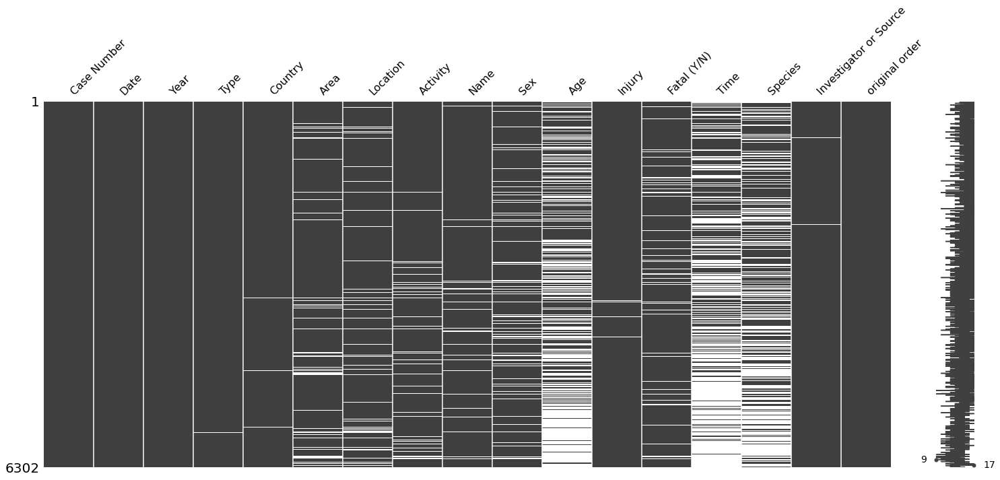

In [ ]:
# maak de missing values inzichtelijk:
import missingno as msno
display(msno.matrix(df3))
# display(msno.bar(df3))
# display(msno.heatmap(df3))
# msno.dendrogram(df3)

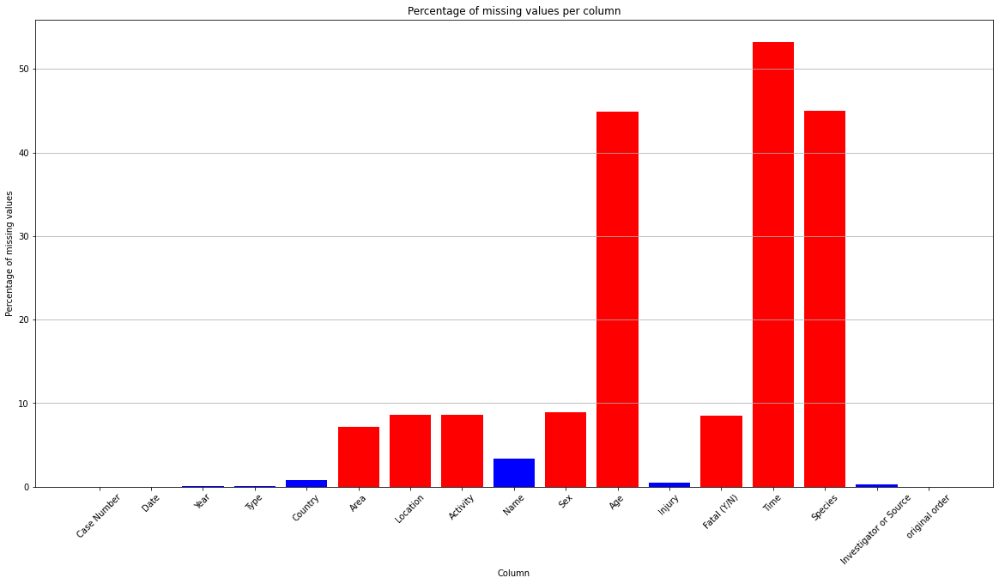

In [ ]:
# 2. make a vertical bar chart with a bar for each column
fig, ax = plt.subplots()


questions = df3.columns
percent_missing = df3.isnull().mean() * 100


# 3. if a column has more than 6 percent missing: make it red
colors = ["blue" if pct <= 6 else "red" for pct in percent_missing]

ax.bar(questions, percent_missing, color=colors)

# Make x labels readable
plt.xticks(rotation=45)

# 4. add labels for the x- and y-axis
plt.xlabel("Column")

plt.ylabel("Percentage of missing values")

# 5. add a title
plt.title("Percentage of missing values per column")


# 6. add horizontal grid lines
ax.grid(True, axis="y")


fig.set_size_inches(20,10) # Make chart a little bigger

plt.show()

In [ ]:
df3

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,original order
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark,"R. Collier, GSAF",6303.0
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14h00 -15h00,NaN,"K.McMurray, TrackingSharks.com",6302.0
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN,"K.McMurray, TrackingSharks.com",6301.0
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,NaN,Minor injury to lower leg,N,NaN,2 m shark,"B. Myatt, GSAF",6300.0
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"Tiger shark, 3m",A .Kipper,6299.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6297,ND.0005,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,Roebuck Bay,Diving,male,M,NaN,FATAL,Y,NaN,NaN,"H. Taunton; N. Bartlett, p. 234",6.0
6298,ND.0004,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,NaN,Pearl diving,Ahmun,M,NaN,FATAL,Y,NaN,NaN,"H. Taunton; N. Bartlett, pp. 233-234",5.0
6299,ND.0003,1900-1905,0.0,Unprovoked,USA,North Carolina,Ocracoke Inlet,Swimming,Coast Guard personnel,M,NaN,FATAL,Y,NaN,NaN,"F. Schwartz, p.23; C. Creswell, GSAF",4.0
6300,ND.0002,1883-1889,0.0,Unprovoked,PANAMA,NaN,"Panama Bay 8ºN, 79ºW",NaN,Jules Patterson,M,NaN,FATAL,Y,NaN,NaN,"The Sun, 10/20/1938",3.0


# Dataframe cleanen per kolom

## Functies gebruikt voor cleanen

In [ ]:
def print_separator(sep, num, msg):
  print("\n")
  print(sep * num)
  print(f"{msg}")
  print(sep * num)


def look_at_unique_values(column): 
  unique_values_cutoff = 260  # Mocht je de hele lijst willen zien, dan 50 veranderen in bijv 160 of 260
    # Het gekke is dat het mij wel lukt om de lijst te sorteren bij kolom: "q4-country"
    # Met:
    # sorted = df.loc[:,'q4-country'].sort_values()
    # sorted.unique() 
  unique_values = column.unique()
  num_unique_values = len(unique_values)
  if num_unique_values == len(column):
    print(f"Each value in the column is unique (total: {num_unique_values})")
  elif num_unique_values < unique_values_cutoff:
    print(f"Less than {unique_values_cutoff} unique values:")
    # We may get an error when sorting
    try:
      sorted = np.sort(unique_values) # Op stack overflow staat dat .sort verouderd is: deze regel oorspronkelijk
      # sorted = df.loc[:, 'q4-country'].sort_values() # Er zelf bij gemaakt, weet niet hoe je de kolom generiek maakt
      # sorted.unique() # Er zelf bij gemaakt
      print("Values are sorted")
      # display(list(sorted.unique())) # Oorspronkelijk zonder .unique() Dit geeft de lijst op elke regel een nieuw land
      display(sorted.unique()) # Er zelf bij gemaakt Dit geeft de lijst met op elke regel meerdere landen, compacter
    except:
      print("Could not sort values")
      display(list(unique_values))
  else:
    print(f"More than {unique_values_cutoff} unique values (total: {num_unique_values})")


def look_at_edges(df, column_name):
  # inner function
  def show_head_and_tail(values):
      num_items_to_slice = 10
      display(list(values)[:num_items_to_slice])
      display(list(values)[-num_items_to_slice:])

  column = df[column_name]
  unique_values = column.unique()
  try:
      sorted = np.sort(unique_values)
      print("Unique values sorted, head and tail:")
      show_head_and_tail(sorted)
  except TypeError as error:
      print(f"Could not sort values: {error}")
      print("..so let's try filtering NULL values and then sorting")
      non_null_uniques = df.loc[~df[column_name].isnull(), column_name].unique()
      sorted = np.sort(non_null_uniques)
      show_head_and_tail(sorted)


def cast_to_type(column, maybe_type):
  try:
    column.astype(maybe_type)
    print(f"Casting to {maybe_type} was successful")
  except ValueError as error:
    print(f"Could not cast to {maybe_type}: {error}")


def find_non_default_missing_values(df, column_name, maybe_type):
  long_separator_amount = 80
  short_separator_amount = 40

  print_separator("*", long_separator_amount, f"Finding non default missing values for column \"{column_name}\"")

  print(f"Column \"{column_name}\" has datatype: {df.dtypes[column_name]}")

  column = df[column_name]  

  # A
  print_separator("-", short_separator_amount, "A: Looking at unique values")
  look_at_unique_values(column)

  # B
  print_separator("-", short_separator_amount, "B: Sorting and looking at the edges")
  look_at_edges(df, column_name)

  # C
  print_separator("-", short_separator_amount, f"C: Casting to type: {maybe_type}")
  cast_to_type(column, maybe_type)

  # D
  print_separator("-", short_separator_amount, "D: Looking at frequency")
  display(column.value_counts(dropna=False))

  print("\n")

In [ ]:
# Eigenlijk niet nodig, want functie in een functie, kun je ook zelf
def replace_value(df, column_name, missing_old, missing_new):
  # ⚠️ Mutates df
  df[column_name] = df[column_name].replace({missing_old: missing_new})


# Helper functions
def display_default_null_values(df, column_name):
  nulls = df.loc[df[column_name].isnull()]
  print(f"Number of default null values in \"{column_name}\": {len(nulls)}")


# Easier to type
nat = np.datetime64('nat')

## Kolom 'Fatal (Y/N)'

In [ ]:
# Bekijk de kolom 'Fatal (Y/N)'
find_non_default_missing_values(df3, "Fatal (Y/N)", "string")




********************************************************************************
Finding non default missing values for column "Fatal (Y/N)"
********************************************************************************
Column "Fatal (Y/N)" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Could not sort values


['N', 'Y', nan, 'M', 'UNKNOWN', '2017', ' N', 'N ', 'y']



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering NULL values and then sorting


[' N', '2017', 'M', 'N', 'N ', 'UNKNOWN', 'Y', 'y']

[' N', '2017', 'M', 'N', 'N ', 'UNKNOWN', 'Y', 'y']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


N          4293
Y          1388
NaN         539
UNKNOWN      71
 N            7
M             1
2017          1
N             1
y             1
Name: Fatal (Y/N), dtype: int64

In [ ]:
# Cleanen van de kolom 'Fatal (Y/N)':

# We willen NaN veranderen in None
# We willen UNKNOWN en 2017 veranderen in None
# We willen M veranderen in N (zitten naast elkaar op  het toetsenbord, waarschijnlijk tikfout)
# We  willen y veranderen in Y (ook waarschijnlijk tikfout)

# ⚠️VRAAG: hoe kan het dat het datatype int64 is?
# N en Y zijn toch strings?
# Er staat één keer 2017 in de kolom,  misschien daardoor?

replace_value(df3, 'Fatal (Y/N)', np.nan, None)
replace_value(df3, 'Fatal (Y/N)', "UNKNOWN", None)
replace_value(df3, 'Fatal (Y/N)', "2017", None)
replace_value(df3, 'Fatal (Y/N)', "M", "N")
replace_value(df3, 'Fatal (Y/N)', "y", "Y")  # Nodig bij "attacks_CSViewer.csv"
replace_value(df3, 'Fatal (Y/N)', " N", "N")
replace_value(df3, 'Fatal (Y/N)', "N ", "N")  # Nodig bij "attacks_CSViewer.csv"

<ipython-input-811-da3a8370b159>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column_name] = df[column_name].replace({missing_old: missing_new})


In [ ]:
# Bekijk de kolom 'Fatal (Y/N)' opnieuw
find_non_default_missing_values(df3, "Fatal (Y/N)", "string")
# Alleen nog Y, N en None over, dus alles is goed gegaan



********************************************************************************
Finding non default missing values for column "Fatal (Y/N)"
********************************************************************************
Column "Fatal (Y/N)" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Could not sort values


['N', 'Y', None]



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering NULL values and then sorting


['N', 'Y']

['N', 'Y']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


N      4302
Y      1389
NaN     611
Name: Fatal (Y/N), dtype: int64

In [ ]:
# Alles is nu prima opgeschoond in deze kolom!
# ⚠️Let op da je voor de verschillende inleesmthoden andere waardes in de kolom krijgt!!!!

In [ ]:
# Bereken het percentage missing values:
missing_fatal_cleaned = df3.loc[:,'Fatal (Y/N)'].isnull().sum()
percentage_fatal_cleaned = round((missing_fatal / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Fatal (Y/N)' after cleaning is {percentage_fatal_cleaned}%.")
print(f"The percentage of missing values for column 'Fatal (Y/N)' before cleaning is {percentage_fatal}%.")


The percentage of missing values for column 'Fatal (Y/N)' after cleaning is 8.553%.
The percentage of missing values for column 'Fatal (Y/N)' before cleaning is 8.553%.


## Kolom 'Species'

In [ ]:
# Bekijk de kolom 'Species'
find_non_default_missing_values(df3, "Species", "string")

# Ziet er allemaal prima uit......
# Er zijn in totaal 1532 verschillende "Species" # bij "attacks_CSViewer.csv"
# Er zijn in totaal 1550 verschillende "Species" # bij "attacks.csv"




********************************************************************************
Finding non default missing values for column "Species"
********************************************************************************
Column "Species" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
More than 260 unique values (total: 1550)


----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering NULL values and then sorting


[' ',
 ' "gummy" shark (Rhizoprionodon or Loxodon) 1.2 m [4\']',
 " 1.5 m [5'] dusky shark",
 " 6' to 8' shark",
 " Blacktip shark, C. maculipinnis. 1.9 m to 2.1 m [6.5' to 7'] ",
 ' Bull shark, 1.2m ',
 ' Bull shark, 2.5 m',
 " Bull shark, 5'",
 " Bull shark, 8'",
 " Galapagos shark, 6'"]

['small hammerhead shark',
 'small nurse shark',
 'small shark',
 'small sharks',
 "small sharks'",
 'unknown, possibly a white shark',
 'whaler shark',
 'white shark',
 '\xa0 ',
 '“small brown shark”']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


NaN                                                                                                                              2838
White shark                                                                                                                       163
Shark involvement prior to death was not confirmed                                                                                105
Invalid                                                                                                                           102
Shark involvement not confirmed                                                                                                    88
                                                                                                                                 ... 
1.2 m to 1.5 m [4.5' to 5'] shark                                                                                                   1
Bull shark, 2.3 m [7.5']                                      

In [ ]:
# In de Species kolom de NaN's vervangen door None's
df3.loc[:,"Species"] = df3.loc[:,"Species"].replace({np.NaN: None})

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [ ]:
# Bereken hoeveel  officiele missing values er zijn:
missing_species_cleaned = df3.loc[:,'Species'].isnull().sum()
percentage_species_cleaned = round((missing_species / total_rows) * 100,3)
print(f"The percentage of missing values for column 'species' after cleaning is {percentage_species_cleaned}%.")
print(f"The percentage of missing values for column 'species' before cleaning is {percentage_species}%.")

The percentage of missing values for column 'species' after cleaning is 45.033%.
The percentage of missing values for column 'species' before cleaning is 45.033%.


## Kolom 'Age'

In [ ]:
# Bekijk de kolom 'Age'
find_non_default_missing_values(df3, "Age", "float64")



********************************************************************************
Finding non default missing values for column "Age"
********************************************************************************
Column "Age" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Could not sort values


['57',
 '11',
 '48',
 nan,
 '18',
 '52',
 '15',
 '12',
 '32',
 '10',
 '21',
 '34',
 '30',
 '60',
 '33',
 '29',
 '54',
 '41',
 '37',
 '56',
 '19',
 '25',
 '69',
 '38',
 '55',
 '35',
 '46',
 '45',
 '14',
 '40s',
 '28',
 '20',
 '24',
 '26',
 '49',
 '22',
 '7',
 '31',
 '17',
 '40',
 '13',
 '42',
 '3',
 '8',
 '50',
 '16',
 '82',
 '73',
 '20s',
 '68',
 '51',
 '39',
 '58',
 'Teen',
 '47',
 '61',
 '65',
 '36',
 '66',
 '43',
 '60s',
 '9',
 '72',
 '59',
 '6',
 '27',
 '64',
 '23',
 '71',
 '44',
 '62',
 '63',
 '70',
 '18 months',
 '53',
 '30s',
 '50s',
 'teen',
 '77',
 '74',
 '28 & 26',
 '5',
 '86',
 '18 or 20',
 '12 or 13',
 '46 & 34',
 '28, 23 & 30',
 'Teens',
 '36 & 26',
 '8 or 10',
 '84',
 '\xa0 ',
 ' ',
 '30 or 36',
 '6½',
 '21 & ?',
 '75',
 '33 or 37',
 'mid-30s',
 '23 & 20',
 ' 30',
 '7      &    31',
 ' 28',
 '20?',
 "60's",
 '32 & 30',
 '16 to 18',
 '87',
 '67',
 'Elderly',
 'mid-20s',
 'Ca. 33',
 '74 ',
 '45 ',
 '21 or 26',
 '20 ',
 '>50',
 '18 to 22',
 'adult',
 '9 & 12',
 '? & 19',
 '9



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering NULL values and then sorting


[' ',
 '  ',
 ' 28',
 ' 30',
 ' 43',
 '"middle-age"',
 '"young"',
 '(adult)',
 '1',
 '10']

['MAKE LINE GREEN',
 'Teen',
 'Teens',
 'X',
 'adult',
 'mid-20s',
 'mid-30s',
 'teen',
 'young',
 '\xa0 ']



----------------------------------------
C: Casting to type: float64
----------------------------------------
Could not cast to float64: could not convert string to float: '40s'


----------------------------------------
D: Looking at frequency
----------------------------------------


NaN               2831
17                 154
18                 150
19                 142
20                 141
                  ... 
20?                  1
 28                  1
7      &    31       1
 30                  1
13 or 14             1
Name: Age, Length: 158, dtype: int64

In [ ]:
# Ik wil graag ALLE value_counts zien en niet alleen de 5 aan de top en de 5 aan de bottom
# Zo kan ik beter beslissen of ik een waarde aan ga passen of dat het de moeite niet is.

    # https://stackoverflow.com/questions/67182821/python-valuecounts-method-display-all-results
    # If suppose the name of dataframe is 'df' then use

    # counts = df.year.value_counts()
    # counts.to_csv('name.csv',index=false)
    # As our terminal can't display entire columns they just display the top and bottom
    # by collapsing the remaining values so try saving in a csv and see the records

# Een andere (makkelijkere) optie is de 'age' kolom samen te voegen met de 'Fatal(Y/N)' kolom
# via crosstab, dat werkte bi de vorige vraag ook fantastisch

# Toon de ongeveer 150 verschillende 'Age' waardes om een groffe inspectie te doen
pd.crosstab(df3["Age"], df3["Fatal (Y/N)"])


Fatal (Y/N),N,Y
Age,,
,2,0
,0,1
28,1,0
30,1,0
43,1,0
...,...,...
adult,1,0
mid-30s,1,0
teen,5,0


In [ ]:
# de kolom 'Age' cleanen

# Strategie: alles wat duidelijk is vervangen door een leeftijd boven of onder de 18 jaar
# Waar 'or' staat en de betreffende leeftijden behoren tot dezelfde groep, deze vervangen door een integer in de goede groep
# Waar 'or' staat en de betreffende leeftijden behoren NIET tot dezelfde groep, deze vervangen door np.NAN (Dit is niet ideaal!!!!)

# Waar '&' staat en de betreffende leeftijden horen tot dezelfde groep deze vervangen door de eerste leeftijd
# Waar '&' staat en de betreffende leeftijden horen tot een andere groep deze vervangen door np.NAN (Dit is niet ideaal!!!!)
# Waar '&' staat en van de betreffende leeftijden is er één onbekend, kies dan voor de bekende

# Je wilt niet dat één incident (rij) meerdere incidenten worden, dus gekozen voor bovenstaande

# Nieuwe kolom maken als kolom schoon is en alles is omgezet naar integers:
# Iedereen jonger  18 jaar is een kind
# Iedereen ouder of gelijk aan 18 jaar is volwassen

# Voor leeftijden die niet precies duidelijk zijn, 
# maar waarbij je wel weet of het een volwassene is of een kind,
# is een willekeurige leeftijd gekozen in het goede bereik

# Leeftijd die gebruikt is, stel ik nooit gelijk aan nul, want die nul heb ik nodig voor iets anders
# dus '2 to 3 months' wordt 1 jaar

# Onderstaande om te zetten waardes uit de crosstabs tabel gehaald:

df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'20s': 25})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'40s': 45})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'60s': 65})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'teen': 15})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'30s': 35})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'50s': 55})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'70s': 75})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'Teen': 15})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'18 months': 2})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'�': np.NaN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'middle-age': 55})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'young': 10})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'(adult)': 50})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'10 or 12': 10})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'12 or 13': 12})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'13 or 14': 13})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'13 or 18': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'17 & 16': 17})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'17 & 35': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'18 or 20': 18})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'18 to 22': 18})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'20?': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'21 & ?': 21})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'21 or 26': 21})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'23 & 26': 23})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'25 or 28': 25})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'25 to 35': 25})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'28 & 26': 28})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'28, 23 & 30': 28})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'2½': 3})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'30 & 32': 30})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'30 or 36': 30})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'31 or 33': 31})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'32 & 30': 32})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'33 & 26': 33})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'33 & 37': 33})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'33 or 37': 33})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'36 & 23': 36})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'36 & 26': 36})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'46 & 34': 46})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'50 & 30': 50})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'60\'s': 65})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'6½': 7})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'7 & 31': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'7 or 8': 7})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'8 or 10': 8})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'9 & 12': 9})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'9 months': 1})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'9 or 10': 9})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'>50': 55})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'? & 14': 14})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'A.M.': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'Both 11': 11})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'Elderly': 50})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'F': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'MAKE LINE GREEN': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'Teens': 15})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'X': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'adult': 50})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'mid-30s': 35})

# Bovenstaande waren alle waardes die in de crosstabs tabel stonden omgezet naar integers
# Wat heel gek is, is dat de crosstabs tabel niet alle unieke waardes weergeeft die bestaan
# Er moeten dus nog meer strings omgezet worden naar juiste integers:
# Hiervoor toch naar de unieke values gekeken

# ⚠️WAAROM GEEFT DE CROSSTABS KOLOM NIET ALLE UNIEKE WAARDES WEER??????

#  '\xa0 ',
#  ' ',
#  '23 & 20',
#  ' 30',
#  '7      &    31',
#  ' 28',
#  '16 to 18',
#  'mid-20s',
#  'Ca. 33',
#  '? & 19',
#  '37, 67, 35, 27,  ? & 27',
#  '21, 34,24 & 35',
#  '"middle-age"',
#  '34 & 19',
#  '2 to 3 months',
#  '"young"',
#  '  ',
#  '?    &   14',
# '74 ',
#  '45 ',
#  '20 ',


df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'\xa0 ': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({' ': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'23 & 20': 23})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({' 30': 30})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'7      &    31': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({' 28': 28})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'16 to 18': 16})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'mid-20s': 25})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'Ca. 33': 33})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'? & 19': 19})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'37, 67, 35, 27,  ? & 27': 37})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'21, 34,24 & 35': 21})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'"middle-age"': 55})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'34 & 19': 34})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'2 to 3 months': 1})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'"young"': 10})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'  ': np.NAN})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'?    &   14': 14})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'74 ': 74})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'45 ': 45})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'20 ': 20})
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({' 43': 43})

# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})
# df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({'':})





/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [ ]:
# Nu alle strings omzetten in integers!
# https://sparkbyexamples.com/pandas/pandas-convert-column-to-int/

# Dit lukt alleen als er geen NAN's in de kolom staan
# Dus eerste alle missing values omzetten naar bijvoorbeeld 0

# later kun je deze alsnog weer veranderen in np.NAN

# np.nan moet zonder ''

df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({np.nan: 0})


# Andere manier met fillna gaat niet goed

# df3["Age"] = df["Age"].fillna(0)

# BOVENSTAANDE GAAT NIET GOED,  WANT DAN VERLIES IK ALLE OMGEZETTEN WAARDES
# ⚠️WAAROM????





In [ ]:
# Maak van alle waardes in de kolom 'Age integer waardes'
df3 = df3.astype({'Age':'int'})

In [ ]:
# Bekijk nog een keer de kolom 'Age'
find_non_default_missing_values(df3, "Age", "float64")



********************************************************************************
Finding non default missing values for column "Age"
********************************************************************************
Column "Age" has datatype: int64


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Values are sorted
Could not sort values


[57,
 11,
 48,
 0,
 18,
 52,
 15,
 12,
 32,
 10,
 21,
 34,
 30,
 60,
 33,
 29,
 54,
 41,
 37,
 56,
 19,
 25,
 69,
 38,
 55,
 35,
 46,
 45,
 14,
 28,
 20,
 24,
 26,
 49,
 22,
 7,
 31,
 17,
 40,
 13,
 42,
 3,
 8,
 50,
 16,
 82,
 73,
 68,
 51,
 39,
 58,
 47,
 61,
 65,
 36,
 66,
 43,
 9,
 72,
 59,
 6,
 27,
 64,
 23,
 71,
 44,
 62,
 63,
 70,
 2,
 53,
 77,
 74,
 5,
 86,
 84,
 75,
 87,
 67,
 1,
 81,
 78]



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Unique values sorted, head and tail:


[0, 1, 2, 3, 5, 6, 7, 8, 9, 10]

[73, 74, 75, 77, 78, 81, 82, 84, 86, 87]



----------------------------------------
C: Casting to type: float64
----------------------------------------
Casting to float64 was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


0     2843
17     155
15     154
18     152
19     143
      ... 
87       1
67       1
72       1
81       1
82       1
Name: Age, Length: 82, dtype: int64

In [ ]:
# Maak nu van de nullen weer NaN's
df3.loc[:,"Age"] = df3.loc[:,"Age"].replace({0: np.nan})

# Als ik dat doe dan worden de integers weer floats!!!!!

In [ ]:
# Percentage missing values in the column 'Age':
# Get the percentage after cleaning
missing_age = df3.loc[:,'Age'].isnull().sum()
percentage = round((missing_age / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Age' is {percentage}%.")


The percentage of missing values for column 'Age' is 45.113%.


Het percentage_missing_values voor het cleanen van de kolom is 44,9%

Het percentage missing values na het cleanen van de kolom is 45,11 %

Er is dus niet veel data verloren gegaan

## Kolom 'Type'

In [ ]:
# Bekijk de kolom 'Type'
find_non_default_missing_values(df3, "Type", "string")





********************************************************************************
Finding non default missing values for column "Type"
********************************************************************************
Column "Type" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Could not sort values


['Boating',
 'Unprovoked',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 nan,
 'Boat',
 'Boatomg']



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering NULL values and then sorting


['Boat',
 'Boating',
 'Boatomg',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 'Unprovoked']

['Boat',
 'Boating',
 'Boatomg',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 'Unprovoked']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


Unprovoked      4595
Provoked         574
Invalid          547
Sea Disaster     239
Boating          203
Boat             137
NaN                4
Questionable       2
Boatomg            1
Name: Type, dtype: int64

In [ ]:
# Alles  wat niet 'Unprovoked' of 'Provoked' is omzetten naar None
# (Ik heb geen idee of bijvoorbeeld Boating of Sea disaster provoked is of niet)

df3['Type'] = df3['Type'].replace({"Invalid": None})
df3['Type'] = df3['Type'].replace({"Sea Disaster": None})
df3['Type'] = df3['Type'].replace({"Boating": None})
df3['Type'] = df3['Type'].replace({"Boat": None})
df3['Type'] = df3['Type'].replace({"Questionable": None})
df3['Type'] = df3['Type'].replace({"Boatomg": None})
df3['Type'] = df3['Type'].replace({np.nan: None})

# df['Type'] = df['Type'].replace({"": None})


In [ ]:
# Bekijk de kolom 'Type' opnieuw
find_non_default_missing_values(df3, "Type", "string")



********************************************************************************
Finding non default missing values for column "Type"
********************************************************************************
Column "Type" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
Less than 260 unique values:
Could not sort values


[None, 'Unprovoked', 'Provoked']



----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'str' and 'NoneType'
..so let's try filtering NULL values and then sorting


['Provoked', 'Unprovoked']

['Provoked', 'Unprovoked']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


Unprovoked    4595
NaN           1133
Provoked       574
Name: Type, dtype: int64

In [ ]:
# Percentage missing values in the column 'Type':
# Get the percentage after cleaning
missing_type = df3.loc[:,'Type'].isnull().sum()
percentage = round((missing_type / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Type' is {percentage}%.")

The percentage of missing values for column 'Type' is 17.978%.


In [ ]:
print(f"Het percentage missing data na grof cleanen van de kolom 'Type' is {percentage_type}%")
print(f"Het percentage missing data na cleanen van de kolom 'Type' is {percentage}%")

Het percentage missing data na grof cleanen van de kolom 'Type' is 0.063%
Het percentage missing data na cleanen van de kolom 'Type' is 17.978%


Omdat voor mij onduidelijk was of sea disaster en boating provoked zijn of niet
heb ik deze als missing data geclassificeerd. Daarom nu toch 18 % missing data.


## Kolom 'Activity'

In [ ]:
# Bekijk de kolom 'Activity'
find_non_default_missing_values(df3, "Activity", "string")



********************************************************************************
Finding non default missing values for column "Activity"
********************************************************************************
Column "Activity" has datatype: object


----------------------------------------
A: Looking at unique values
----------------------------------------
More than 260 unique values (total: 1533)


----------------------------------------
B: Sorting and looking at the edges
----------------------------------------
Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering NULL values and then sorting


[' ',
 '   ',
 ' a canoe was pursuing a schooner that had forcibily abducted 5 young girls',
 '"Boat accident"',
 '"Climbing up to ship after repairing the stern in water"',
 '"Crossing the river"',
 '"Flying Tiger" transport plane went down with 5 men onboard',
 '"Riding waves on a board"',
 '"Swimming vigorously"',
 '.']

['preparing to go skin diving',
 'pêcheur de bichiques',
 'seaplane Columbus ditched in the sea',
 'ship M.V. Rizal sank during typhoon',
 'ship William Penn grounded & broke apart',
 'ship torpedoed 400 miles off the African coas. Man was clinging to hatch cover',
 'small boat',
 'wreck of the State Oil Company ship Permina',
 'yachting accident',
 'yachtsman in a zodiac']



----------------------------------------
C: Casting to type: string
----------------------------------------
Casting to string was successful


----------------------------------------
D: Looking at frequency
----------------------------------------


Surfing                                   971
Swimming                                  869
NaN                                       544
Fishing                                   431
Spearfishing                              333
                                         ... 
Playing with a frisbee in the shallows      1
Sinking of the ferryboat Dumaguete          1
Wreck of the Storm King                     1
Feeding mullet to sharks                    1
Wreck of  large double sailing canoe        1
Name: Activity, Length: 1533, dtype: int64

In [ ]:
df3.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'original order'],
      dtype='object')

In [ ]:
# Bekijk alle 1533 unieke 'Activity' met crosstabs
# Toon de ongeveer 1500 verschillende 'Activity' om een groffe inspectie te doen
# Dit is tot nu toe de handigste methode die ik heb gevonden om door de kolom 'Activity' te lopen
pd.crosstab(df3["Activity"], df3["Fatal (Y/N)"])



Fatal (Y/N),N,Y
Activity,,
,1,0
,1,0
a canoe was pursuing a schooner that had forcibily abducted 5 young girls,0,1
"""Boat accident""",0,1
"""Climbing up to ship after repairing the stern in water""",0,1
...,...,...
ship William Penn grounded & broke apart,1,0
ship torpedoed 400 miles off the African coas. Man was clinging to hatch cover,1,0
wreck of the State Oil Company ship Permina,0,1


In [ ]:
# In de Activity kolom de NaN's vervangen door None's, mochten die er zijn
df3.loc[:,"Activity"] = df3.loc[:,"Activity"].replace({np.NaN: None})
df3.loc[:,"Activity"] = df3.loc[:,"Activity"].replace({".": None})
df3.loc[:,"Activity"] = df3.loc[:,"Activity"].replace({"kakaying": "kayaking"})
df3.loc[:,"Activity"] = df3.loc[:,"Activity"].replace({"male": None})

In [ ]:
# Bereken hoeveel  officiele missing values er zijn:
missing_activity_cleaned = df3.loc[:,'Activity'].isnull().sum()
percentage_activity_cleaned = round((missing_activity / total_rows) * 100,3)
print(f"The percentage of missing values for column 'Activity' after cleaning is {percentage_activity_cleaned}%.")
print(f"The percentage of missing values for column 'Activity' before cleaning is {percentage_activity}%.")

The percentage of missing values for column 'Activity' after cleaning is 8.632%.
The percentage of missing values for column 'Activity' before cleaning is 8.632%.


# Dataframe: maken extra kolommen

### Maak nieuwe kolom 'New_Species' gebaseerd op de kolom 'Species'

In [ ]:
df3.loc[:,'Species'].sort_values()

3622        
5555        
1357        
1348        
1454        
        ... 
6297    None
6298    None
6299    None
6300    None
6301    None
Name: Species, Length: 6302, dtype: object

In [ ]:
df3.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'original order'],
      dtype='object')

In [ ]:
# Toon de ongeveer 1500 verschillende 'Species' om een groffe inspectie te doen
# Dit is tot nu toe de handigste methode die ik heb gevonden om door de kolom 'Species te lopen'
pd.crosstab(df3["Species"], df3["Fatal (Y/N)"])

Fatal (Y/N),N,Y
Species,,
,4,1
"""gummy"" shark (Rhizoprionodon or Loxodon) 1.2 m [4']",1,0
1.5 m [5'] dusky shark,1,0
6' to 8' shark,1,0
"Blacktip shark, C. maculipinnis. 1.9 m to 2.1 m [6.5' to 7']",1,0
...,...,...
"unknown, possibly a white shark",1,0
whaler shark,1,0
white shark,1,0


In [ ]:
# Alles in Species naar lower case letters brengen
df3.loc[:,'Species'] = df3.loc[:,'Species'].str.lower()

In [ ]:
# Alle None's vervangen door de string "leeg" anders doet str.contains het niet
df3.loc[:,"Species"] = df3.loc[:,"Species"].fillna("leeg")

# ⚠️Opmerking:
# Dit had ook nog anders gekunt, door na=False te gebruiken, bij str.contains!!!
# Understand the reason behind "ValueError: 
# cannot index with vector containing NA / NaN values" and correct it with str.contains('pattern',na=False)
# https://stackoverflow.com/questions/11350770/filter-pandas-dataframe-by-substring-criteria/55335207#55335207

In [ ]:
# Maak nieuwe kolom "New_Species" met in elke cel de waarde 0
df3['New_Species'] = 0

# Vul de kolom 'New_Species' met haaiensoorten, gehaald uit de kolom 'Species':

# https://stackoverflow.com/questions/43905930/conditional-if-statement-if-value-in-row-contains-string-set-another-column

# De volgende methode vult overal NaN's in als één van de opgegeven strings niet aanwezig is:

df3.loc[df3['Species'].str.contains('blacktip'), 'New_Species'] = 'blacktip shark'
df3.loc[df3['Species'].str.contains('bull'), 'New_Species'] = 'bull shark'
df3.loc[df3['Species'].str.contains('bronze'), 'New_Species'] = 'bronze whaler shark'
df3.loc[df3['Species'].str.contains('blue'), 'New_Species'] = 'blue nose/blue whaler/blue pointeshark'
df3.loc[df3['Species'].str.contains('bonita'), 'New_Species'] = 'bonita shark'
df3.loc[df3['Species'].str.contains('broadnose'), 'New_Species'] = 'broadnose sevengill shark'
df3.loc[df3['Species'].str.contains('caribbean'), 'New_Species'] = 'caribbean reef shark'
df3.loc[df3['Species'].str.contains('carpet'), 'New_Species'] = 'carpet shark'
df3.loc[df3['Species'].str.contains('copper'), 'New_Species'] = 'copper shark'
df3.loc[df3['Species'].str.contains('dusky'), 'New_Species'] = 'dusky shark'
df3.loc[df3['Species'].str.contains('grey'), 'New_Species'] = 'grey shark (including nurse and reef shark)'
df3.loc[df3['Species'].str.contains('gray'), 'New_Species'] = 'grey shark (including nurse and reef shark)'
df3.loc[df3['Species'].str.contains('hammerhead'), 'New_Species'] = 'hammerhead shark'
df3.loc[df3['Species'].str.contains('lemon'), 'New_Species'] = 'lemon shark'
df3.loc[df3['Species'].str.contains('mako'), 'New_Species'] = 'mako shark'
df3.loc[df3['Species'].str.contains('nurse'), 'New_Species'] = 'nurse shark'
df3.loc[df3['Species'].str.contains('oceanic'), 'New_Species'] = 'oceanic whitetip shark'
df3.loc[df3['Species'].str.contains('porbeagle'), 'New_Species'] = 'porbeagle shark'
df3.loc[df3['Species'].str.contains('raggedtooth'), 'New_Species'] = 'raggedtooth shark'
df3.loc[df3['Species'].str.contains('sandtiger'), 'New_Species'] = 'sandtiger shark'
df3.loc[df3['Species'].str.contains('seven'), 'New_Species'] = 'sevengill shark'
df3.loc[df3['Species'].str.contains('spinner'), 'New_Species'] = 'spinner shark'
df3.loc[df3['Species'].str.contains('tiger'), 'New_Species'] = 'tiger shark'
df3.loc[df3['Species'].str.contains('white'), 'New_Species'] = 'white shark'
df3.loc[df3['Species'].str.contains('whitetip'), 'New_Species'] = 'whitetip reef shark'
df3.loc[df3['Species'].str.contains('wobbegong'), 'New_Species'] = 'wobbegong shark'
df3.loc[df3['Species'].str.contains('zambesi'), 'New_Species'] = 'zambesi shark'


In [ ]:
# alles in kolom 'Species' waar thought, said of possibly in staat vervangen door "Not sure" in de kolom 'New_Species'

df3.loc[df3['Species'].str.contains('thought'), 'New_Species'] = 'Not Sure'
df3.loc[df3['Species'].str.contains('said'), 'New_Species'] = 'Not Sure'
df3.loc[df3['Species'].str.contains('possibly'), 'New_Species'] = 'Not Sure'


In [ ]:
# Alle nul waardes in de  kolom  'New_Species' vervangen door None
df3.loc[:,"New_Species"] = df3.loc[:,"New_Species"].replace({0: None})

In [ ]:
df3.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'original order', 'New_Species'],
      dtype='object')

In [ ]:
# Bekijk de missing values van de nieuwe kolom 'New_Species'
# Bereken hoeveel  officiele missing values er zijn:
missing_New_Species_cleaned = df3.loc[:,'New_Species'].isnull().sum()
percentage_New_Species_cleaned = round((missing_New_Species_cleaned / total_rows) * 100,3)
print(f"The percentage of missing values for column 'New_Species' after cleaning is {percentage_New_Species_cleaned}%.")
print(f"The percentage of missing values for column 'Species' after cleaning is {percentage_species_cleaned}%.")

The percentage of missing values for column 'New_Species' after cleaning is 70.724%.
The percentage of missing values for column 'Species' after cleaning is 45.033%.


Er is heel veel data verloren gegaan. In eerste instantie waren er al 45% missing data (kolom 'Species'). Na het maken van de nieuwe kolom 'New_Species' is er nog meer data verloren gegaan. Er is een percentage van 71% missing data in de kolom 'New_Species'.

### Maak nieuwe kolom 'New_Acitivity' gebaseerd op de kolom 'Activity'

In [ ]:
# Alles in 'Activity' naar lower case letters brengen
df3.loc[:,'Activity'] = df3.loc[:,'Activity'].str.lower()

In [ ]:
# Alle None's vervangen door de string "leeg" anders doet str.contains het niet
df3.loc[:,"Activity"] = df3.loc[:,"Activity"].fillna("leeg")

In [ ]:
# Maak  een nieuwe kolom  'New_Activity' met in elke cel de waarde 0

df3['New_Activity'] = 0

# Vul de kolom 'New_Activity' met activities, gehaald uit de kolom 'Activity':

# https://stackoverflow.com/questions/43905930/conditional-if-statement-if-value-in-row-contains-string-set-another-column

# De volgende methode vult overal NaN's in als één van de opgegeven strings niet aanwezig is:

# Let op dat de volgorde waarin onderstaande staat ook uitmaakt!!!


# Alle strings die de nieuwe activiteit 'overboard' krijgen
df3.loc[df3['Activity'].str.contains('boat'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('ship'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('overboard'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('fell'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('jump'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('sinking'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('swept'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('capsized'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('sunk'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('torpedoed'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('swept'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('ton'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('USS'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('sank'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('steamer'), 'New_Activity'] = 'overboard'
df3.loc[df3['Activity'].str.contains('schooner'), 'New_Activity'] = 'overboard'

# Alle strings die iets met surfen te maken hebben
df3.loc[df3['Activity'].str.contains('surf'), 'New_Activity'] = 'surfing'
# Met nu een onderverdeling die een andere string meegeven dan 'surfing'
df3.loc[df3['Activity'].str.contains('surf fishing'), 'New_Activity'] = 'surf fishing'
df3.loc[df3['Activity'].str.contains('bodysurfing'), 'New_Activity'] = 'body surfing'
df3.loc[df3['Activity'].str.contains('body surfing'), 'New_Activity'] = 'body surfing'
df3.loc[df3['Activity'].str.contains('body-surfing'), 'New_Activity'] = 'body surfing'
df3.loc[df3['Activity'].str.contains('windsurfing'), 'New_Activity'] = 'windsurfing'
df3.loc[df3['Activity'].str.contains('paddle'), 'New_Activity'] = 'paddle surfing'
df3.loc[df3['Activity'].str.contains('paddling'), 'New_Activity'] = 'padde surfing'
df3.loc[df3['Activity'].str.contains('kite'), 'New_Activity'] = 'kite surfing'
# Activiteiten die ook onder surfen gerekend kunnen worden, maar wel een andere naam hebben
df3.loc[df3['Activity'].str.contains('body boarding'), 'New_Activity'] = 'body boarding'
df3.loc[df3['Activity'].str.contains('bodyboarding'), 'New_Activity'] = 'body boarding'
df3.loc[df3['Activity'].str.contains('body-boarding'), 'New_Activity'] = 'body boarding'
df3.loc[df3['Activity'].str.contains('boogie'), 'New_Activity'] = 'boogie boarding'

df3.loc[df3['Activity'].str.contains('dived'), 'New_Activity'] = 'diving'
df3.loc[df3['Activity'].str.contains('diving'), 'New_Activity'] = 'diving'
df3.loc[df3['Activity'].str.contains('free'), 'New_Activity'] = 'free diving'
df3.loc[df3['Activity'].str.contains('hookah'), 'New_Activity'] = 'hookah diving'
df3.loc[df3['Activity'].str.contains('scuba'), 'New_Activity'] = 'scuba diving'
df3.loc[df3['Activity'].str.contains('skin'), 'New_Activity'] = 'skindiving'

df3.loc[df3['Activity'].str.contains('fishing'), 'New_Activity'] = 'fishing'
df3.loc[df3['Activity'].str.contains('spearfishing'), 'New_Activity'] = 'spaerfishing'
df3.loc[df3['Activity'].str.contains('shark fishing'), 'New_Activity'] = 'shark fishing'
df3.loc[df3['Activity'].str.contains('surf fishing'), 'New_Activity'] = 'surf fishing' # expres hier dubbel, anders valt ie weg!!!

df3.loc[df3['Activity'].str.contains('kakaying'), 'New_Activity'] = 'kayaking'
df3.loc[df3['Activity'].str.contains('kayak'), 'New_Activity'] = 'kayaking'
df3.loc[df3['Activity'].str.contains('canoe'), 'New_Activity'] = 'canoeing'

df3.loc[df3['Activity'].str.contains('wading'), 'New_Activity'] = 'wading'
df3.loc[df3['Activity'].str.contains('wade'), 'New_Activity'] = 'wading'

# alles wat maar één keer gedefinieerd wordt
df3.loc[df3['Activity'].str.contains('bathing'), 'New_Activity'] = 'bathing'
df3.loc[df3['Activity'].str.contains('sailing'), 'New_Activity'] = 'sailing'
df3.loc[df3['Activity'].str.contains('feeding'), 'New_Activity'] = 'feeding'
df3.loc[df3['Activity'].str.contains('filming'), 'New_Activity'] = 'filming'
df3.loc[df3['Activity'].str.contains('floating'), 'New_Activity'] = 'floating'
df3.loc[df3['Activity'].str.contains('hunting'), 'New_Activity'] = 'hunting'
df3.loc[df3['Activity'].str.contains('collecting'), 'New_Activity'] = 'collecting'
df3.loc[df3['Activity'].str.contains('raft'), 'New_Activity'] = 'rafting'
df3.loc[df3['Activity'].str.contains('playing'), 'New_Activity'] = 'playing'
df3.loc[df3['Activity'].str.contains('rowing'), 'New_Activity'] = 'rowing'
df3.loc[df3['Activity'].str.contains('sea disaster'), 'New_Activity'] = 'sea disaster'
df3.loc[df3['Activity'].str.contains('snorkeling'), 'New_Activity'] = 'snorkeling'
df3.loc[df3['Activity'].str.contains('splashing'), 'New_Activity'] = 'splashing'
df3.loc[df3['Activity'].str.contains('standing'), 'New_Activity'] = 'standing'
df3.loc[df3['Activity'].str.contains('swimming'), 'New_Activity'] = 'swimming'
df3.loc[df3['Activity'].str.contains('treading'), 'New_Activity'] = 'treading water'
df3.loc[df3['Activity'].str.contains('walking'), 'New_Activity'] = 'walking'
df3.loc[df3['Activity'].str.contains('washing'), 'New_Activity'] = 'washing'

# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''
# df3.loc[df3['Activity'].str.contains(''), 'New_Activity'] = ''


In [ ]:
# alles in kolom 'Activity' waar 'or', '?', '/' of '&' in staat vervangen door "Not sure" in de kolom 'New_Species'
# Dit om  er zeker van te zijn dat alles wat je invult in de kolom 'New_Spacies' zeker is

df3.loc[df3['Activity'].str.contains('or'), 'New_Activity'] = 'Not Sure'
# df3.loc[df3['Activity'].str.contains('?'), 'New_Activity'] = 'Not Sure' 
#  Deze geeft error: nothing to repeat at position 0
# ⚠️⚠️⚠️ vraagteken is kennelijk een speciaal teken
# zie: https://stackoverflow.com/questions/54678990/how-to-tell-if-series-elements-contain-question-mark-in-python
# Op te lossen met regex=False
df3.loc[df3['Activity'].str.contains('?', regex=False), 'New_Activity'] = 'Not Sure' 
df3.loc[df3['Activity'].str.contains('/'), 'New_Activity'] = 'Not Sure'
df3.loc[df3['Activity'].str.contains('&'), 'New_Activity'] = 'Not Sure'

In [ ]:
# Alle nul waardes in de  kolom  'New_Activity' vervangen door None
df3.loc[:,"New_Activity"] = df3.loc[:,"New_Activity"].replace({0: None})

In [ ]:
df3.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'original order', 'New_Species',
       'New_Activity'],
      dtype='object')

In [ ]:
# Bekijk de missing values van de nieuwe kolom 'New_Activity'
# Bereken hoeveel  officiele missing values er zijn:
missing_new_activity_cleaned = df3.loc[:,'New_Activity'].isnull().sum()
percentage_new_activity_cleaned = round((missing_new_activity_cleaned / total_rows) * 100,3)
print(f"The percentage of missing values for column 'New Activity' after cleaning is {percentage_new_activity_cleaned}%.")
print(f"The percentage of missing values for column 'Activity' after cleaning is {percentage_activity_cleaned}%.")

The percentage of missing values for column 'New Activity' after cleaning is 13.155%.
The percentage of missing values for column 'Activity' after cleaning is 8.632%.


Er is ongeveer 5,5 % van de waardes in kolom 'Activity' niet omgezet naar een waarde in kolom 'New_Activity'. 

Netjes, er is niet veel verloren gegaan van de data.

# Gecleand Dataframe

In [ ]:
df3

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,original order,New_Species,New_Activity
0,2018.06.25,25-Jun-2018,2018.0,None,USA,California,"Oceanside, San Diego County",paddling,Julie Wolfe,F,57.0,"No injury to occupant, outrigger canoe and pad...",N,18h00,white shark,"R. Collier, GSAF",6303.0,white shark,padde surfing
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",standing,Adyson McNeely,F,11.0,Minor injury to left thigh,N,14h00 -15h00,leeg,"K.McMurray, TrackingSharks.com",6302.0,None,standing
2,2018.06.09,09-Jun-2018,2018.0,None,USA,Hawaii,"Habush, Oahu",surfing,John Denges,M,48.0,Injury to left lower leg from surfboard skeg,N,07h45,leeg,"K.McMurray, TrackingSharks.com",6301.0,None,surfing
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,surfing,male,M,NaN,Minor injury to lower leg,N,NaN,2 m shark,"B. Myatt, GSAF",6300.0,None,surfing
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,free diving,Gustavo Ramos,M,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"tiger shark, 3m",A .Kipper,6299.0,tiger shark,free diving
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6297,ND.0005,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,Roebuck Bay,diving,male,M,NaN,FATAL,Y,NaN,leeg,"H. Taunton; N. Bartlett, p. 234",6.0,None,diving
6298,ND.0004,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,NaN,pearl diving,Ahmun,M,NaN,FATAL,Y,NaN,leeg,"H. Taunton; N. Bartlett, pp. 233-234",5.0,None,diving
6299,ND.0003,1900-1905,0.0,Unprovoked,USA,North Carolina,Ocracoke Inlet,swimming,Coast Guard personnel,M,NaN,FATAL,Y,NaN,leeg,"F. Schwartz, p.23; C. Creswell, GSAF",4.0,None,swimming
6300,ND.0002,1883-1889,0.0,Unprovoked,PANAMA,NaN,"Panama Bay 8ºN, 79ºW",leeg,Jules Patterson,M,NaN,FATAL,Y,NaN,leeg,"The Sun, 10/20/1938",3.0,None,None


# 1. what are the most dangerous types of sharks to humans?

De vraag kan op meerdere manieren opgevat worden. Wat wordt verstaan onder dangerous?


>a.   Welke haaien soort doet de meeste aanvallen naar mensen?

>b.   Welke haaien soort geeft het grootste percentage attacks met fatale afloop?

>c.   De grafiekjes van de eerste twee vragen kunnen nog gecombineerd worden in een derde grafiek,  om een beter overzicht te krijgen van de verhoudingen.

We gaan proberen antwoord te geven op de vragen.

Hiervoor hebben we de kolommen 'Fatal (Y/N)' en 'Species' nodig

## Vraag 1a: Welke haaien soort doet de meeste aanvallen naar mensen?


### Uitwerking

In [ ]:
# Voor de beantwoording van deze vraag is de kolom 'New_Species' gemaakt
# gebaseerd op de kolom 'Species'
# Zie hoofdstukje: 'Maak extra kolommen'
# met subhoofdstukje: Maak nieuwe kolom 'New_Species' gebaseerd op de kolom 'Species'

# de kolom 'New_Species' bekijken:
# display(df3.loc[:,"New_Species"])
# display(df3.loc[:,"New_Species"].value_counts)
df3.loc[:,"New_Species"].value_counts(dropna=False)

NaN                                            4457
white shark                                     615
tiger shark                                     268
bull shark                                      156
Not Sure                                        137
nurse shark                                      93
blacktip shark                                   64
bronze whaler shark                              59
blue nose/blue whaler/blue pointeshark           53
mako shark                                       50
wobbegong shark                                  49
raggedtooth shark                                43
hammerhead shark                                 42
spinner shark                                    35
lemon shark                                      34
grey shark (including nurse and reef shark)      30
whitetip reef shark                              26
zambesi shark                                    23
caribbean reef shark                             18
sevengill sh

In [ ]:
df3.columns


Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species', 'Investigator or Source', 'original order', 'New_Species',
       'New_Activity'],
      dtype='object')

Value_counts returnt een series, er moet dus wat gebeuren om er een dataframe van te maken, om er daarna een grafiekje van te maken


https://re-thought.com/pandas-value_counts/#:~:text=If%20you%20want%20to%20have,value_counts()%20.&text=If%20you%20need%20to%20name,in%20a%20slightly%20different%20way.

As mentioned at the beginning of the article, value_counts returns series, not a dataframe. If you want to have your counts as a dataframe you can do it using function .to_frame() after the .value_counts().

We can convert the series to a dataframe as follows:

Syntax - df['your_column'].value_counts().to_frame()

In [ ]:
# Maak een dataframe van de value_counts
# Let op! De Null waardes verdwijnen hier automatisch!!!
df3_3 = df3['New_Species'].value_counts().to_frame()
df3_3

,New_Species
white shark,615
tiger shark,268
bull shark,156
Not Sure,137
nurse shark,93
blacktip shark,64
bronze whaler shark,59
blue nose/blue whaler/blue pointeshark,53
mako shark,50
wobbegong shark,49


In [ ]:
df3_3.columns

Index(['New_Species'], dtype='object')

In [ ]:
# Hernoem de kolom 'New_Species' naar 'number_of_attacks'
# df.rename({'a': 'X', 'b': 'Y'}, axis=1, inplace=True)
df3_3.rename({'New_Species': 'number_of_attacks'}, axis=1, inplace=True)


In [ ]:
# Maak nieuwe kolom 'percentage_attacks'
# (We  gebruiken hem niet voor het beantwoorden van de vraag)
df3_3['percentage_attacks'] = ((df3_3.loc[:, 'number_of_attacks']/(df3_3.loc[:, 'number_of_attacks'].sum()))*100).round(3)

In [ ]:
df3_3

,number_of_attacks,percentage_attacks
white shark,615,33.333
tiger shark,268,14.526
bull shark,156,8.455
Not Sure,137,7.425
nurse shark,93,5.041
blacktip shark,64,3.469
bronze whaler shark,59,3.198
blue nose/blue whaler/blue pointeshark,53,2.873
mako shark,50,2.710
wobbegong shark,49,2.656


In [ ]:
# Het percentage 'Not Sure' kan uit bovenstaande tabel  worden gehaald:
percentage_not_sure_3 = df3_3.loc['Not Sure', 'percentage_attacks']
print(f'Het percentage "Not Sure" (activiteiten die niet geheel eenduidig zijn -alles waar in kolom "Species" thought, said of possibly in staat-)')
print(f'bedraagt {percentage_not_sure_3}% van de toale activiteiten na verwijdering van de null-values')

# of op de volgende manier worden berekend:
# Percentage 'Not Sure' uitrekenen na verwijderen missing values:
# percentage_not_sure_3  = round((df3_3.loc['Not Sure', 'number_of_attacks']/df3_3.loc[:, 'number_of_attacks'].sum())* 100,3)
# percentage_not_sure_3
# print(f'Het percentage "Not Sure" (activiteiten die niet geheel eenduidig zijn -alles waar in kolom 'Species' thought, said of possibly in staat-')
# print(f'bedraagt {percentage_not_sure_3}% van de toale activiteiten na verwijdering van de null-values')

Het percentage "Not Sure" (activiteiten die niet geheel eenduidig zijn -alles waar in kolom "Species" thought, said of possibly in staat-)
bedraagt 7.425% van de toale activiteiten na verwijdering van de null-values


In [ ]:
# Maak dataframe iets kleiner, door alléén naar de haaien te kijken,
# waarbij meer dan 15 attacks bekend zijn
# Probeer eerst de boolean mask:
df3_3.loc[:, 'number_of_attacks'] >= 25
# Dit klopt, geeft True als het True moet zijn en False als het False moet zijn

# Nu de boolean _mask toepassen op het dataframe:
df3_3_1  = df3_3.loc[df3_3.loc[:, 'number_of_attacks'] >= 25]
df3_3_1


,number_of_attacks,percentage_attacks
white shark,615,33.333
tiger shark,268,14.526
bull shark,156,8.455
Not Sure,137,7.425
nurse shark,93,5.041
blacktip shark,64,3.469
bronze whaler shark,59,3.198
blue nose/blue whaler/blue pointeshark,53,2.873
mako shark,50,2.710
wobbegong shark,49,2.656


### Verantwoording Conclusie:
Voor het beantwoorden van deze vraag is de kolom 'Species' nodig. Het aantal missing values in die kolom is vrij hoog (45,033 %). (Na het cleanen blijft het percentage missing values hetzelfde(45,033%)).

Om de vraag te kunnen beantwoorden is een nieuwe kolom gemaakt ('New_Species'), gebaseerd op de gegevens van de kolom 'Species', om het grote aantal unieke activiteiten (ongeveer 1500) terug te brengen tot een behapbaar, overzichtelijk aantal.

Er is voor gekozen om alle kolommen die de hierna genoemde strings bevatten om te zetten naar en nieuwe string in de nieuwe kolom 'New_Species':


*   'blacktip' wordt in nieuwe kolom       'blacktip shark'
*   'bull' wordt in nieuwe kolom       'bull shark'
*   'bronze' wordt in nieuwe kolom       'bronze whaler shark'
*   'blue' wordt in nieuwe kolom       'blue nose/blue whaler/blue pointeshark'
*   'bonita' wordt in nieuwe kolom       'bonita shark'
*   'broadnose' wordt in nieuwe kolom      'broadnose sevengill shark'
*   'caribbean' wordt in nieuwe kolom      'caribbean reef shark'
*   'carpet' wordt in nieuwe kolom       'carpet shark'
*   'copper' wordt in nieuwe kolom       'copper shark'
*   'dusky' wordt in nieuwe kolom      'dusky shark'
*   'grey' wordt in nieuwe kolom       'grey shark (including nurse and reef shark)'
*   'gray' wordt in nieuwe kolom       'grey shark (including nurse and reef shark)'
*   'hammerhead' wordt in nieuwe kolom       'hammerhead shark'
*   'lemon' wordt in nieuwe kolom      'lemon shark'
*   'mako' wordt in nieuwe kolom       'mako shark'
*   'nurse' wordt in nieuwe kolom      'nurse shark'
*   'oceanic' wordt in nieuwe kolom      'oceanic whitetip shark'
*   'porbeagle' wordt in nieuwe kolom      'porbeagle shark'
*   'raggedtooth' wordt in nieuwe kolom      'raggedtooth shark'
*   'sandtiger' wordt in nieuwe kolom      'sandtiger shark'
*   'seven' wordt in nieuwe kolom      'sevengill shark'
*   'spinner' wordt in nieuwe kolom      'spinner shark'
*   'tiger' wordt in nieuwe kolom      'tiger shark'
*   'wobbegong' wordt in nieuwe kolom      'wobbegong shark'
*   'zambesi' wordt in nieuwe kolom      'zambesi shark'


*   'white' wordt in nieuwe kolom      'white shark'
*   'whitetip' wordt in nieuwe kolom       'whitetip reef shark' 

>> (hierbij wordt een onderscheid gemaakt tussen de white shark en de whitetip reef shark. Eerst wordt alles waar de string 'white' in staat vervangen in de nieuwe kolom 'New_Species' door 'white shark'. Daarna wordt alles waar in de oude kolom 'Species' de string 'whitetip' voorkomt in de nieuwe kolom 'New_Species' de string 'whitetip reef shark' ingevuld.)

Mochten er species zijn die de string 'white' bevatten en die niet tot de subcatogorie 'whitetip reef shark' behoren dan kregen ze op deze manier de species naam 'white shark'.

Om alle gevallen uit te sluiten,  waarbij de activiteit niet helemaal duidelijk was, is er voor gekozen om alle rijen waarin de volgende strings voorkomen ('thought', 'said' en/of 'possibly') in de nieuwe kolom 'New_Species' te benoemen als 'Not sure'.

Na het maken van de nieuwe kolom 'New_Species' bedraagt het aantal missing values 70,724%. Dit is een vrij aanzienlijk percentage. Door de bovenstaande werkwijze is dus nog meer data verdwenen, omdat die niet duidelijk in te delen was in een bepaalde catogorie haaien-soorten (species).  

Het percentage 'Not sure' dat voorkomt in de kolom 'New-Species' bedraagt (na verwijderen missing null-values) 7,425 %.
('Not sure' geeft alles weer waarbij in kolom "Species" thought, said of possibly staat, en waarbij de aanvallende haai dus niet duidelijk was.)

We laten deze rij voorlopig staan. Pas bij 1c als de percentages worden weergegeven laten we deze rij vervallen.

Houdt wel in de gaten: Onderstaande conclusie is gebaseerd op de gebruikte dataset.


### Conclusie

De meeste aanvallen worden gedaan door de White shark (615 zekere aanvallen geregistreerd).  Hierna volgen de Tiger shark (268 aanvallen) en de Bull shark (156 aanvallen). (Zie barplot in cel hierna) 

Kanttekening: Het percentage rijen waarover in de kolom 'Species' niks bekend is, is heel groot: ongeveer 45 procent van 6302 rijen = 2836 rijen (gevallen). Er wordt in werkelijkheid gewerkt met de afgeleide kolom 'New_Species'. Daarbij is het aantal missing values nog veel groter, namelijk 70,7%!!!!  

In theorie zou het dus mogelijk kunnen zijn dat er een haai bestaat die (voor er herkenning van de soort heeft plaatsgevonden) wel bestaat,  maar niet uit deze dataset gehaald kan worden en zo helemaal gemist wordt als mogelijke soort die mensen aanvalt.

Om erachter te komen wat percentueel de dodelijkste haai is voor mensen zullen we nog wat anders moeten doen zie vraag 1b).

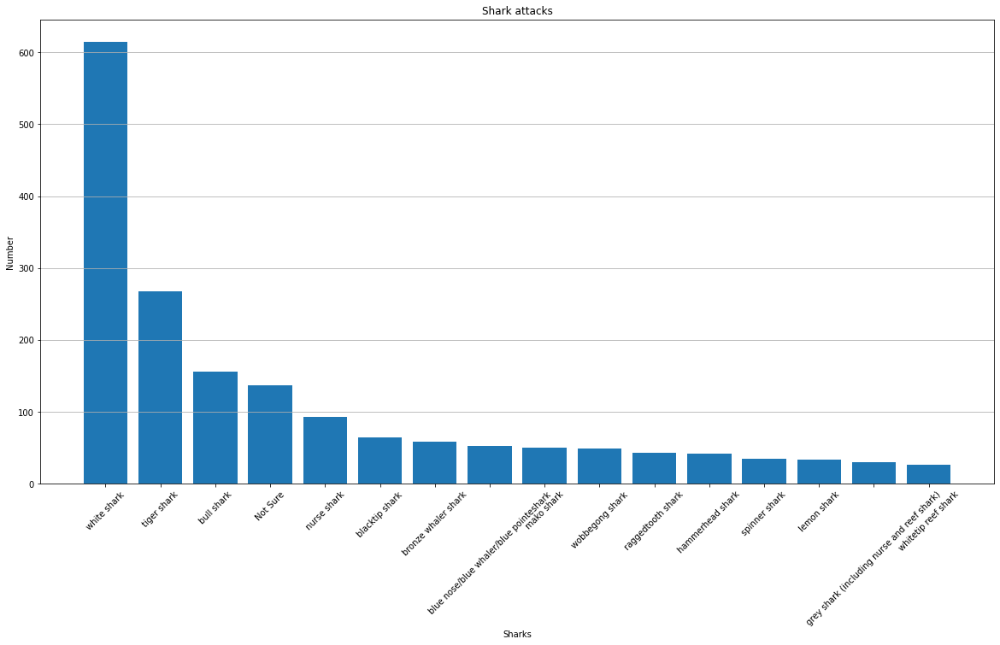

In [ ]:
# make a vertical bar chart with a bar for each column
fig, ax = plt.subplots()

# definieer x en y-as
sharks = df3_3_1.index
attack_counts = df3_3_1.loc[:,'number_of_attacks']

# maak verticale bar chart
ax.bar(sharks, attack_counts)

# Make x labels readable
plt.xticks(rotation=45)

# add labels for the x- and y-axis
plt.xlabel("Sharks")

plt.ylabel("Number")

# add a title
plt.title("Shark attacks")


# add horizontal grid lines
ax.grid(True, axis="y")

# Make chart a little bigger
fig.set_size_inches(20,10)

plt.show()

## Vraag 1b. Welke haaien soort geeft het grootste percentage attacks met fatale afloop?

### Uitwerking

Nu de kolommen Fatal(Y/N) en New_Species samen bekijken.

Je wilt dus voor elke specifiek haaien soort in de kolom New_Species weten wat het percentage Y is en het percentage N.

In [ ]:
df3_1 = pd.crosstab(df3["New_Species"], df3["Fatal (Y/N)"])
df3_1

Fatal (Y/N),N,Y
New_Species,,
Not Sure,93,34
blacktip shark,64,0
blue nose/blue whaler/blue pointeshark,40,11
bonita shark,1,0
bronze whaler shark,56,2
bull shark,124,31
caribbean reef shark,18,0
carpet shark,8,0
copper shark,5,0


In [ ]:
df3_1.columns
# De eerste kolom  is nu een index!

Index(['N', 'Y'], dtype='object', name='Fatal (Y/N)')

In [ ]:
# Nu een nieuwe kolom maken met het percentage fatal per haaiensoort
df3_1['Percentage_fatal'] = ((df3_1.loc[:, 'Y']/(df3_1.loc[:, 'Y'] + df3_1.loc[:,'N']))*100).round(3)
df3_1

Fatal (Y/N),N,Y,Percentage_fatal
New_Species,,,
Not Sure,93,34,26.772
blacktip shark,64,0,0.000
blue nose/blue whaler/blue pointeshark,40,11,21.569
bonita shark,1,0,0.000
bronze whaler shark,56,2,3.448
bull shark,124,31,20.000
caribbean reef shark,18,0,0.000
carpet shark,8,0,0.000
copper shark,5,0,0.000


In [ ]:
df3_1.columns

Index(['N', 'Y', 'Percentage_fatal'], dtype='object', name='Fatal (Y/N)')

In [ ]:
df3_1

Fatal (Y/N),N,Y,Percentage_fatal
New_Species,,,
Not Sure,93,34,26.772
blacktip shark,64,0,0.000
blue nose/blue whaler/blue pointeshark,40,11,21.569
bonita shark,1,0,0.000
bronze whaler shark,56,2,3.448
bull shark,124,31,20.000
caribbean reef shark,18,0,0.000
carpet shark,8,0,0.000
copper shark,5,0,0.000


In [ ]:
# Gebruik een boolean mask om alleen die rijen weer te geven met een percentage fatal van boven de 0.01 procent 
df3_2  = df3_1.loc[df3_1.loc[:, 'Percentage_fatal'] >= 0.01]
# ascending = True moest verwijderd worden,  anders werkte het niet

In [ ]:
df3_2

Fatal (Y/N),N,Y,Percentage_fatal
New_Species,,,
Not Sure,93,34,26.772
blue nose/blue whaler/blue pointeshark,40,11,21.569
bronze whaler shark,56,2,3.448
bull shark,124,31,20.000
hammerhead shark,41,1,2.381
lemon shark,33,1,2.941
mako shark,48,2,4.000
tiger shark,197,67,25.379
white shark,471,135,22.277


In [ ]:
# Nu dataframe sorteren:
# final_df = df.sort_values(by=['2'], ascending=False)
df3_2= df3_2.sort_values(by=['Percentage_fatal'], ascending=False )


In [ ]:
df3_2


Fatal (Y/N),N,Y,Percentage_fatal
New_Species,,,
Not Sure,93,34,26.772
tiger shark,197,67,25.379
white shark,471,135,22.277
blue nose/blue whaler/blue pointeshark,40,11,21.569
bull shark,124,31,20.000
whitetip reef shark,21,5,19.231
zambesi shark,19,4,17.391
mako shark,48,2,4.000
bronze whaler shark,56,2,3.448


### Verantwoording Conclusie:

Zie vraag 1a

Verder wordt ook de kolom 'Fatal (Y/N)' gebruikt. Deze kolom heeft na grof cleanen een percentage missing values van 8,6 %. Na het cleanen blijft dit percentage hertzelfde. Er gaan dus weinig/ geen data verloren hierbij.

Houdt wel in de gaten: Onderstaande conclusie is gebaseerd op de gebruikte dataset.

### Conclusie

De top 3 dodelijkste haaien is:

1.   Tiger shark: 25,4 % van de aanvallen van deze haai zijn dodelijk
2.   White shark: 22,3 % van de aanvallen van deze haai zijn dodelijk
2.   Blue shark (combinatie van blue nose, blue whaler en blue pointer shark): 21,6 % van de aanvallen van deze haai zijn dodelijk

De dodelijkste soort haai is de Tiger shark. Als de mens wordt aangevallen door de Tiger shark, is er 25 procent kans dat je het er niet levend vanaf brengt. Op de tweede plaats staat de White shark, met een fataliteit van 22 procent. Niet ver daarachter volgt de blue shark (combinatie van blue nose, blue whaler en blue pointer shark). (Zie barplot in cel hierna) 

Extra opmerking:

De rij waarin de haaiensoort niet precies bekend is ('Not Sure') geeft een nog hoger percentage fataliteit. Dit zou eventueel te verklaren kunnen zijn door bijvoorbeeld de volgende situatie:

> de persoon in kwestie die is aangevallen is misschien zo erg toegetakeld dat hij/zij het niet overleeft, en dus waarschijnlijk ook geen goede beschrijving van de haai kan geven.



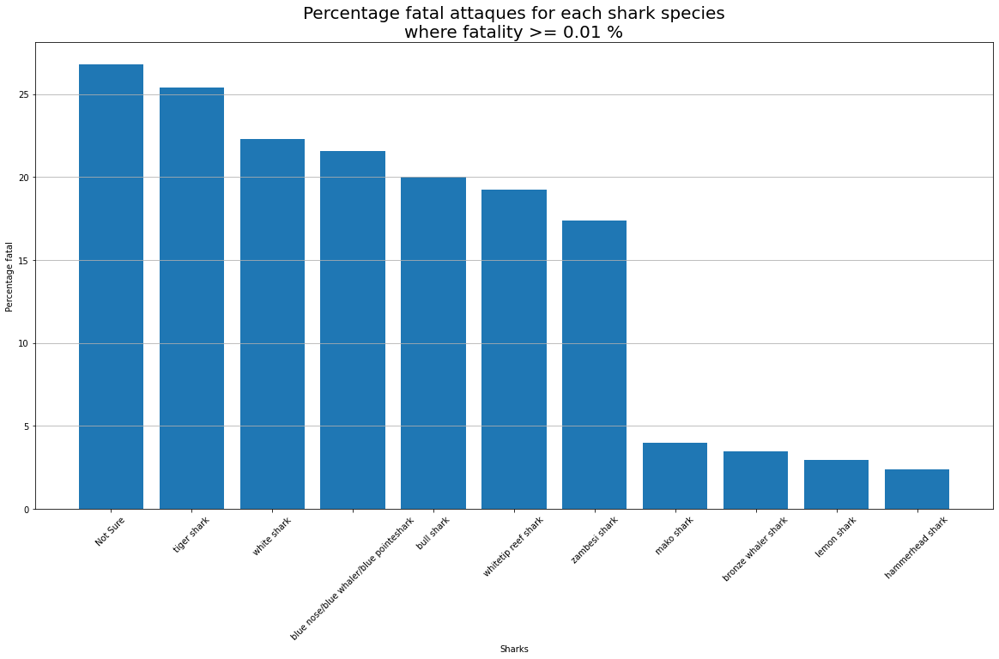

In [ ]:
# Barchart met percentage fataliteit per haai:

fig, ax = plt.subplots()


sharks = df3_2.index
percentage_fatal = df3_2.loc[:,'Percentage_fatal']

# Make bar chart
ax.bar(sharks, percentage_fatal)

# Make x labels readable
plt.xticks(rotation=45)

# 4. add labels for the x- and y-axis
plt.xlabel("Sharks")

plt.ylabel("Percentage fatal")

# 5. add a title
fontsize = 20
plt.title("Percentage fatal attaques for each shark species\nwhere fatality >= 0.01 %", fontsize=fontsize)


# 6. add horizontal grid lines
ax.grid(True, axis="y")


fig.set_size_inches(20,10) # Make chart a little bigger

plt.show()

## Vraag 1c 
Combineer de grafieken bij vraag 1a en vraag 1b voor een overzichtelijke grafiek die de percentages weergeeft van 'shark attacks' per haaien soort met daarin ook verwerkt de fataliteit per haaiensoort.


### Uitwerking

In [ ]:
# (Verder gaan met df3_1 om de grafieken uit vraag 1a en 1b te combineren in één grafiek)
# (Zie voor df3_1 vraag 1b)

In [ ]:
df3_1

Fatal (Y/N),N,Y,Percentage_fatal
New_Species,,,
Not Sure,93,34,26.772
blacktip shark,64,0,0.000
blue nose/blue whaler/blue pointeshark,40,11,21.569
bonita shark,1,0,0.000
bronze whaler shark,56,2,3.448
bull shark,124,31,20.000
caribbean reef shark,18,0,0.000
carpet shark,8,0,0.000
copper shark,5,0,0.000


In [ ]:
# Voor deze vraag de rij 'Not Sure' verwijderen
# Deze hebben we al in de vorige vraag besproken en
# we werken nu verder met 'species' die zeker zijn
df3_1 = df3_1.drop(['Not Sure'], axis = 0)



In [ ]:
# Totale aantal geregistreerde haaienaanvallen waarvan de soort bekend is:
total_attacks_N = df3_1.loc[:, 'N'].sum()
total_attacks_N 
total_attacks_Y = df3_1.loc[:, 'Y'].sum()
total_attacks_Y 
total_attacks = total_attacks_N + total_attacks_Y 
total_attacks
percentage_fatal = ((total_attacks_Y/total_attacks)*100).round(3)
print(f"Het totale aantal attacks dat niet fataal afloopt is {total_attacks_N}, het totale aantal attacks dat wel fataal afloopt is {total_attacks_Y}")
print(f"Het totale aantal attacks dat meedoet in deze berekening (en waarvan de soort dus bekend is) is {total_attacks}")
print(f"Het percentage attacks dat fataal afloopt is {percentage_fatal} %")

Het totale aantal attacks dat niet fataal afloopt is 1428, het totale aantal attacks dat wel fataal afloopt is 259
Het totale aantal attacks dat meedoet in deze berekening (en waarvan de soort dus bekend is) is 1687
Het percentage attacks dat fataal afloopt is 15.353 %


In [ ]:
# Maak nieuwe kolom met totaal percentage N per rij 'perc_N_overall':

df3_1.loc[:, 'perc_N_overall'] = ((df3_1.loc[:,'N']/total_attacks)*100).round(3)


In [ ]:
# Maak nieuwe kolom met totaal percentage Y per rij:

df3_1['perc_Y_overall'] = ((df3_1.loc[:, 'Y']/total_attacks)*100).round(3)

In [ ]:
# index = df3_1.index
# print(index)

In [ ]:
df3_1.columns


Index(['N', 'Y', 'Percentage_fatal', 'perc_N_overall', 'perc_Y_overall'], dtype='object', name='Fatal (Y/N)')

In [ ]:
# Maak nieuwe kolom 'sumNY'
df3_1['sumNY'] = df3_1['N'] + df3_1['Y']

In [ ]:
# dataframe sorteren op kolom 'perc_Y_overall'
# df3_1 = df3_1.sort_values(by = ['perc_Y_overall'])

# Of kies voor andere 

# dataframe sorteren op kolom 'sumNY'
df3_1.sort_values(by = ['sumNY'], inplace=True)


In [ ]:
# Extra controle
# Controleren of de som van de bovenstaande kolommen echt 100% is!!!
total_percentage = df3_1.loc[:, 'perc_N_overall'].sum() + df3_1.loc[:, 'perc_Y_overall'].sum()
total_percentage
# Dit klopt!

99.999

In [ ]:
# Niet echt nodig,maar gebruikt om te controleren of alles klopt
# Maak een nieuwe kolom 'perc_overall' (som van 'pers_N_overall' en/of 'pers_Y_overall')
df3_1['perc_overall'] = (df3_1.loc[:, 'perc_N_overall'] + df3_1.loc[:, 'perc_Y_overall']).round(3)
# Maak een nieuwe kolom 'perc_sum_NY'
df3_1['perc_sum_NY'] = (df3_1.loc[:, 'sumNY']/(df3_1.loc[:, 'sumNY'].sum())*100).round(3)
# en vergelijk deze!!!
df3_1
# Klopt!


Fatal (Y/N),N,Y,Percentage_fatal,perc_N_overall,perc_Y_overall,sumNY,perc_overall,perc_sum_NY
New_Species,,,,,,,,
bonita shark,1,0,0.000,0.059,0.000,1,0.059,0.059
copper shark,5,0,0.000,0.296,0.000,5,0.296,0.296
porbeagle shark,7,0,0.000,0.415,0.000,7,0.415,0.415
carpet shark,8,0,0.000,0.474,0.000,8,0.474,0.474
dusky shark,13,0,0.000,0.771,0.000,13,0.771,0.771
sevengill shark,15,0,0.000,0.889,0.000,15,0.889,0.889
caribbean reef shark,18,0,0.000,1.067,0.000,18,1.067,1.067
zambesi shark,19,4,17.391,1.126,0.237,23,1.363,1.363
whitetip reef shark,21,5,19.231,1.245,0.296,26,1.541,1.541


### Verantwoording Conclusie:

Zie vraag 1a

Er is voor gekozen om de rij 'Not Sure'(waarbij de soort niet helemaal  duidelijk was) niet mee te nemen in de berekening van het percentage 'shark attacks' per soort. Er wordt bij de beantwoording van deze vraag dus alleen gewerkt met de 'shark attacks' waarbij geheel duidelijk is door welke haai de aanval is gedaan!

Houdt wel in de gaten: Onderstaande conclusie is gebaseerd op de gebruikte dataset.

### Conclusie: (De samengestelde grafiek)

Combi grafiek, nu twee grafieken van vraag 1a en vraag 1b gecombineerd, zodat in één blik duidelijk is hoe de percentages verdeeld zijn. (Zie barplot in cel hierna) 

Als het totaal van alle shark attacks (waarbij de aanvallende haai bekend is) op 100 % wordt gezet, dan hebben we de volgende top 3 wat betreft de aanvallen door een haaiensoort:

1.   35,9 % van de aanvallen gebeurd door de 'white shark'
2.   15,6 % van de aanvallen gebeurd door de 'tiger shark'
3.   9,2 % van de aanvallen gebeurd door de 'bull shark'

In totaal zijn 15,3 % van alle haaien aanvallen fataal

De top drie van fatale haaien aanvallen wordt hieronder gegeven:
(let op! het totaal percentage fatale haaien aanvallen is 15,3 %)

1.   8,0 % fataal door een 'white shark'
2.   4,0 % fataal door een 'tiger shark'
3.   1,8 % fataal door een 'bull shark'

Bovenstaande haaien zijn met zijn drieen verantwoordelijk voor 13,8 % van de fatale aanvallen (van de in totaal 15,3 % fatale aanvallen). In totaal zijn deze drie haaien dus verantwoordelijk voor ((13,8/15,3)*100%) = 90 procent van de fatale haaien aanvallen.

Ook bij vraag 1b kwamen deze drie haaien als het meest gevaarlijk uit de bus, als je keek naar het percentage van de aanvallen dat dodelijk was door de betreffende haai. (Hieronder volgt nog n keer de uitkomst van vraag 1b). Alleen staat bij deze top drie de 'tiger shark' op 1 en de 'white shark' op 2.

> De top 3 dodelijkste haaien zijn:

1.   Tiger shark: 25,4 % van de aanvallen van deze haai zijn dodelijk
2.   White shark: 22,3 % van de aanvallen van deze haai zijn dodelijk
2.   Blue shark (combinatie van blue nose, blue whaler en blue pointer shark): 21,6 % van de aanvallen van deze haai zijn dodelijk



***De meest gevaarlijke haaien voor mensen zijn de 'white shark', de 'tiger shark' en de 'bull shark. ***

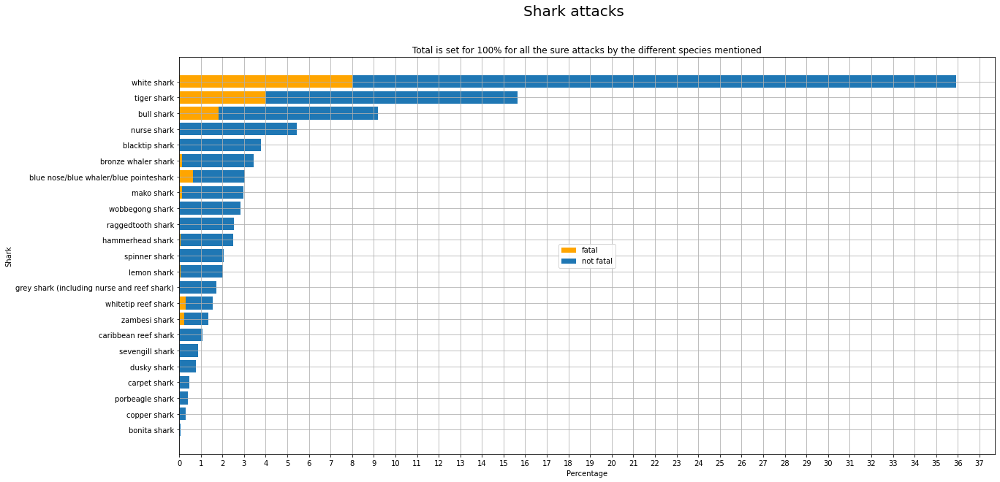

In [ ]:
# Maak nu een nieuwe horizontale bar chart met deze gegevens!
# Maak een horizontal bar chart met stacked columns van 'percentage_N_overall' en 'percentage_Y_overall'
# De ticks op de x-as per 1 weergeven

# make a horizontal bar chart with a bar for each column
fig, ax = plt.subplots()

# definieer x-as en y-as
sharks = df3_1.index
percentage_fatal_N = df3_1.loc[:,'perc_N_overall']
percentage_fatal_Y = df3_1.loc[:,'perc_Y_overall']

# maak horizontale bar chart
ax.barh(sharks, percentage_fatal_Y, label = 'fatal', color='orange')
ax.barh(sharks, percentage_fatal_N, label = 'not fatal', left=percentage_fatal_Y)
# Let  hier heel  goed op, als er maar iets fout staat (bijvoorbeeld geen left =),
# Dan geeft de bar chart het totaal aan van één kolom, ipv de twee kolommen!!!! 

# Make x labels readable
# plt.xticks(rotation=45)

# add labels for the x- and y-axis
plt.xlabel("Percentage")
plt.ylabel("Shark")

# add legend and set position to center
ax.legend(loc='center')

# add a title
fontsize = 20
plt.suptitle("Shark attacks", fontsize = fontsize)
fontsize_2 = 12
plt.title("Total is set for 100% for all the sure attacks by the different species mentioned", fontsize = fontsize_2)

# add horizontal grid lines
ax.grid(True, axis="y")
ax.grid(True, axis="x")

# show percentage more precise (per one tick)
tick_spacing = 1
ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))

# Make chart a little bigger
fig.set_size_inches(20,10)

plt.show()

# 2. Are children more likely to be attacked by sharks?


### Uitwerking
Hiervoor is de kolom 'Age' nodig

Aanname:

Kind < 18 jaar
Volwassene >= 18 jaar
Er is uitgegaan van de aanwezige gegevens uit de gebruikte csv file

In [ ]:
# Tip van Niels 20221028
# Bij de age vraag moet je de volgende stappen doen:

# Schoon de age kolom op door alles te converteren naar integer en rijen waar dit niet kan te vervangen door een bijbehorende integer waarde.
# Maak een nieuwe kolom aan waarin je kinderen classificeert als <18 jaar en ouderen >18 jaar.
# Gebruik deze nieuwe kolom icm .groupby() en .count() om de vraag te beantwoorden

In [ ]:
# Maak een nieuwe kolom 'Adult/Child' 
# Als de leeftijd van een persoon onder de 18 jaar is zet 'child' in deze kolom
# Als de leeftijd van een persoon gelijk of groter dan 18 jaar is zet 'adult' in deze kolom

# Waar ga ik die kolom in maken?
# Het zou eventueel in df3 kunnen,  maar misschien voor het overzicht beter in nieuw dataframe

age = df3.loc[:, ['Age', 'Fatal (Y/N)']]
age

,Age,Fatal (Y/N)
0,57.0,N
1,11.0,N
2,48.0,N
3,NaN,N
4,NaN,N
...,...,...
6297,NaN,Y
6298,NaN,Y
6299,NaN,Y
6300,NaN,Y


In [ ]:
# Maak een nieuwe kolom 'Adult/Child'
# Maak eerst een nieuwe lege kolom:
age.loc[:, 'Adult/Child'] =0


In [ ]:
# Vul de nieuwe kolom 'Adult/Child'
# voorbeeld voor als je maar twee conditions hebt:
# df['color'] = np.where(df['Set']=='Z', 'green', 'red')

age.loc[:, 'Adult/Child'] = np.where(age['Age'] >= 18, 'adult', 'child')

In [ ]:
# ⚠️Pas op dat de NaN's in de 'Age' kolom worden gevuld met de string 'child'
# Waarschijnlijk omdat ik ze eerder heb veranderd in nullen om overal integers van te maken
# Toen heb ik ze terugveranderd in NaN's, maar kennelijk blijft dat toch in geheugen zitten?????
# Of ze voldoen niet aan age >=18 !!!!!! en daarom worden ze 'child'
# Niet erg, want later ga ik ze toch verwijderen

In [ ]:
age

,Age,Fatal (Y/N),Adult/Child
0,57.0,N,adult
1,11.0,N,child
2,48.0,N,adult
3,NaN,N,child
4,NaN,N,child
...,...,...,...
6297,NaN,Y,child
6298,NaN,Y,child
6299,NaN,Y,child
6300,NaN,Y,child


In [ ]:
# Haal alle rijen met NaN' in de kolom 'Age' weg uit de dataframe age
# df.dropna(subset=['name', 'toy']) : Haal alle NaN's weg uit de gespecificeerde kolommen
# age.dropna(subset=['Age'])

# Haal alle rijen met NaN' in de kolom 'Age' en 'Fatal(Y/N)' weg uit de dataframe age
# df.dropna(subset=['name', 'toy']) : Haal alle NaN's weg uit de gespecificeerde kolommen
age.dropna(subset=['Age', 'Fatal (Y/N)'])


,Age,Fatal (Y/N),Adult/Child
0,57.0,N,adult
1,11.0,N,child
2,48.0,N,adult
6,18.0,Y,adult
7,52.0,N,adult
...,...,...,...
6243,16.0,N,child
6254,50.0,Y,adult
6265,13.0,Y,child
6276,16.0,Y,child


In [ ]:
# nagegaan:
# Er staan geen NaN's in de kolom 'Adult/Child'

In [ ]:
# maak tabel met uitgesplitst adult/child en fatal Y/N
age_3 = age.groupby(['Adult/Child', 'Fatal (Y/N)']).count()
age_3

Age
Adult/Child Fatal (Y/N)      
adult       N            1887
            Y             453
child       N             720
            Y             161

In [ ]:
# Hernoem de 'Age' kolom naar 'Counts'
# voorbeeld:
# data.rename(columns={'gdp':'log(gdp)'}, inplace=True)

age_3.rename(columns={'Age':'Counts'}, inplace=True)
age_3

Counts
Adult/Child Fatal (Y/N)        
adult       N              1887
            Y               453
child       N               720
            Y               161

In [ ]:
# Voeg nog een kolom toe naast de 'Counts' kolom met de percentages
# Dan kun je stacked barchart maken
# Maak nieuwe kolom "Percentage"
age_3['Percentage']= round((age_3.loc[:,'Counts']/age_3.loc[:, 'Counts'].sum())*100,3) 
age_3

Counts  Percentage
Adult/Child Fatal (Y/N)                    
adult       N              1887      58.584
            Y               453      14.064
child       N               720      22.353
            Y               161       4.998

In [ ]:
age_3.columns

Index(['Counts', 'Percentage'], dtype='object')

In [ ]:
# Hoe roep  je de verschillende rijen in de kolom 'Percentage' aan?"
adult_fatal_percentage = age_3.iloc[1,1] 
display(adult_fatal_percentage)

adult_non_fatal_percentage = age_3.iloc[0,1] 
display(adult_non_fatal_percentage)

child_fatal_percentage = age_3.iloc[3,1] 
display(child_fatal_percentage)

child_non_fatal_percentage = age_3.iloc[2,1] 
display(child_non_fatal_percentage)

percentage_adults = adult_fatal_percentage + adult_non_fatal_percentage
percentage_childs = child_fatal_percentage + child_non_fatal_percentage
print(f'The percentage adults is {percentage_adults}%')
print(f'The percentage childs is {percentage_childs}%')


percentage_fatal_attacks_in_group_adults = round(adult_fatal_percentage/(adult_fatal_percentage + adult_non_fatal_percentage) * 100, 3)
percentage_fatal_attacks_in_group_childs = round(child_fatal_percentage/(child_fatal_percentage + child_non_fatal_percentage) * 100, 3)
print(f'The percentage fatal attacks in the group of adults is {percentage_fatal_attacks_in_group_adults}%')
print(f'The percentage fatal attacks in the group of childs is {percentage_fatal_attacks_in_group_childs}%')

14.064

58.584

4.998

22.353

The percentage adults is 72.648%
The percentage childs is 27.351000000000003%
The percentage fatal attacks in the group of adults is 19.359%
The percentage fatal attacks in the group of childs is 18.274%


In [ ]:
# Het percentage fatal  attacks bij kinderen en bij volwassenen
print(f"Het percentage fatal attacks bij volwassenen is {percentage_fatal_attacks_in_group_adults} %.")
print(f"Het percentage fatal attacks bij kinderen is {percentage_fatal_attacks_in_group_childs} %.")

def comparison_perc_fatal_att (percentage_fatal_attacks_in_group_adults, percentage_fatal_attacks_in_group_childs):
    if abs((percentage_fatal_attacks_in_group_adults - percentage_fatal_attacks_in_group_childs) <= 1.1):
        print(f"Het verschil in percentage fatal  attacks tussen volwassenen en kinderen is kleiner dan 1,1 %")
comparison_perc_fatal_att (percentage_fatal_attacks_in_group_adults, percentage_fatal_attacks_in_group_childs)


Het percentage fatal attacks bij volwassenen is 19.359 %.
Het percentage fatal attacks bij kinderen is 18.274 %.
Het verschil in percentage fatal  attacks tussen volwassenen en kinderen is kleiner dan 1,1 %


Het aantal fatal attacks tussen kinderen en volwassenen ontloopt elkaar niet veel.

### Verantwoording conclusie:

Er is voor het beantwoorden van deze vraag gebruik gemaakt van de kolom 'Age'.

Het percentage missing values in de kolom 'Age' is na grof cleanen 44,92 % en na cleanen 45,09 %

Er waren dus vanaf het begin al veel null values in de kolom 'Age', waarbij de leeftijd van de aangevallen persoon niet duidelijk was. Na het cleanen van de kolom zijn er nog nog maar weinig null values bijgekomen. De info over de leeftijd kon goed worden omgezet in of een persoon een volwassene of een kind is. 

Omdat de exacte leeftijd van personen niet van belang was, heb ik de volgende strategie toegepast:


*   Er is voor gekozen om voor elke rij maximaal één slachtoffer te nemen.  
*   Als duidelijk was welke leeftijd ongeveer werd bedoeld dan werd die leeftijd als string ingevuld.
*   In het geval waarbij er zowel volwassenen als kinderen in één rij stonden, dan is er voor gekozen om aan die waarde een null value toe te kennen.
*   Waren er meerdere kinderen bij een incident betrokken, dan werd de leeftijd van een kind ingevuld.
*   Waren er meerdere volwassenen bij een incident betrokken, dan werd de leeftijd van een volwassene ingevuld.
*   Was minimaal één leeftijd duidelijk dan werd deze ingevuld
*   Was niet duidelijk of er een kind of een volwassene bij betrokken was, dan werd een null value ingevuld



Vanaf het begin waren er veel missing data in de gebruikte kolom 'Age'. Bij het cleanen is er gelukkig niet veel data extra verloren gegaan.

Houdt wel in de gaten: Onderstaande conclusie is gebaseerd op de gebruikte dataset.

### Conclusie

Er worden meer volwassenen dan kinderen aangevallen door haaien.

Het percentage volwassenen dat wordt aangevallen door haaien bedraagt 72,6% 
Het percentage kinderen dat wordt aangevallen door haaien bedraagt 27,4%
(Zie barplot in cel hierna) 

Hierbij moet de kanttekening gemaakt worden dat dit geldt voor de geregistreerde
attacks uit de gebruikte database. Wat je eigenlijk ook nog nodig hebt is het percentage kinderen en volwassenen dat zich wel eens in zee begeeft en dan het liefst ook nog met de tijdsduur erbij. Dan kun je de per tijdseenheid aanwezige persoon (kind of volwassene) in zee afzetten tegen het aanvalspercentage van de twee groepen.

Dan heb je pas echt de vraag beantwoord of de kans dat kinderen worden aangevallen groter of kleiner is dan dat volwassenen worden aangevallen.

Het percentage fatale aanvallen op kinderen en volwassenen ontloopt elkaar niet veel. Voor volwassenen in dit percentage 19,4% en voor kinderen is dit percentage 18,4%

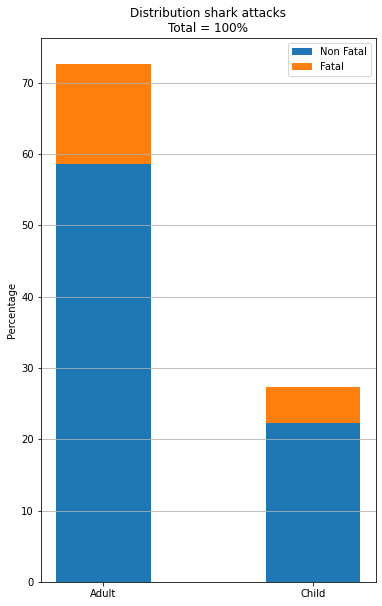

In [ ]:
# Maak een stacked bar chart van  de hierboven genoemde waardes
# Ik wil graag apart de adults in een stacked bar 
# Ik wil graag apert de kinderen in een stacked bar

labels = ['Adult', 'Child']

non_fatal = [adult_non_fatal_percentage, child_non_fatal_percentage]
fatal = [adult_fatal_percentage, child_fatal_percentage]

width = 0.45       # the width of the bars: can also be len(x) sequence

fig, ax = plt.subplots()

# ax.bar(labels, fatal, width, label='Fatal')
# ax.bar(labels, non_fatal, width, bottom=fatal, label='Non Fatal')

ax.bar(labels, non_fatal, width,  label='Non Fatal')
ax.bar(labels, fatal, width, bottom=non_fatal, label='Fatal')


ax.set_ylabel('Percentage')
ax.set_title('Distribution shark attacks\nTotal = 100%')
ax.legend()

ax.grid(True, axis='y')

fig.set_size_inches(6,10) # Make chart a little bigger

plt.show()


In [ ]:
# Leuk artikel over shark attacks in Australie:
# https://royalsocietypublishing.org/doi/10.1098/rsos.201197

# 3. Are shark attacks where sharks were provoked more or less dangerous?


### Uitwerking

Hiervoor zijn de kolommen 'Type' en 'Fatal (Y/N)' nodig.


De vraag wordt als volgt opgevat:
Zit er tussen 'provoked' en 'unprovoked' een verschil in fataliteit?

In [ ]:
# Neem een dataframe met alleen de kolommen 'Type' en 'Fatal (Y/N)'
df5 = df3[['Type', 'Fatal (Y/N)']].copy()

In [ ]:
# Verwijder alle rijen waarin een Null value voorkomt in de kolommen 'Type' en 'Fatal(Y/N)'
df5 = df5.dropna(how='any',axis=0) # Dit verwijdert alle null values in alle kolommen

In [ ]:
df5

,Type,Fatal (Y/N)
1,Unprovoked,N
3,Unprovoked,N
4,Provoked,N
5,Unprovoked,N
6,Unprovoked,Y
...,...,...
6297,Unprovoked,Y
6298,Unprovoked,Y
6299,Unprovoked,Y
6300,Unprovoked,Y


In [ ]:
# We hebben nu een mooie cleane dataframe
# Voor het beantwoorden van de vraag hebben we nodig:
# Het percentage fatale aflopen binnen de groep 'provoked'
# Het percentage fatale aflopen binnen de groep 'unprovoked'

# D.m.v.groupby de dataframe bekijken hierop
df5_2 = df5.groupby(by=['Type', 'Fatal (Y/N)'])['Fatal (Y/N)'].count()

In [ ]:
df5_2

Type        Fatal (Y/N)
Provoked    N               549
            Y                19
Unprovoked  N              3351
            Y              1181
Name: Fatal (Y/N), dtype: int64

In [ ]:
# Hier mooi grafiekje van maken:
# Eerst alles omzetten naar percentages
# stel alles van 'Provoked' op 100%
# stel alles van 'Unprovoked' op 100%
# En vergelijk dan de percentages voor 'fatal'

In [ ]:
# Om hiermee te kunnen rekenen misschien iloc gebruiken
# Dat werkt
df5_2.iloc[0]

549

In [ ]:
percentage_fatal_provoked = round(df5_2.iloc[1]/(df5_2.iloc[0] + df5_2.iloc[1])*100,3)
percentage_fatal_provoked
percentage_fatal_unprovoked = round(df5_2.iloc[3]/(df5_2.iloc[2] + df5_2.iloc[3])*100,3)
percentage_fatal_unprovoked
percentage_not_fatal_provoked = 100 - percentage_fatal_provoked
percentage_not_fatal_unprovoked = 100 - percentage_fatal_unprovoked


print(percentage_fatal_provoked)
print(percentage_fatal_unprovoked)
print(percentage_not_fatal_provoked)
print(percentage_not_fatal_unprovoked)


print(f"Het percentage fatale attacks onder de 'provoked' gevallen is {percentage_fatal_provoked}%")
print(f"Het percentage fatale attacks onder de 'unprovoked' gevallen is {percentage_fatal_unprovoked}%")

3.345
26.059
96.655
73.941
Het percentage fatale attacks onder de 'provoked' gevallen is 3.345%
Het percentage fatale attacks onder de 'unprovoked' gevallen is 26.059%


### Verantwoording conclusie:

Er is voor het beantwoorden van deze vraag gebruik gemaakt van de kolommen 'Type' en 'Fatal (Y/N)'.

Het percentage missing values in de kolom 'Fatal (Y/N)' is zowel na grof cleanen als na cleanen 8,6 %
Het percentage missing values in de kolom 'Type' was na het grof cleanen 0,063 % en na het cleanen 17.978 %. 

Omdat het voor mij niet duidelijk is of de onderstaande 'Types' provoked of unprovoked zijn heb ik ze allemaal vervangen door null waardes. Hierdoor is het percentage null values in de kolom 'Type' gestegen tot 17.978% 


'Type' die allemaal zijn vervangen door null values:


*   "Invalid"
*   "Sea Disaster"
*   "Boating"
*   "Boat"
*   "Questionable"
*   "Boatomg"

Al met al een redelijk laag percentage missing values. Conclusies die hieruit worden getrokken zijn redelijk goed betrouwbaar. Vooral ook omdat het verschil tussen de fataliteit van provoked en unprovoked attacks zo grooot is.

Houdt wel in de gaten: Onderstaande conclusie is gebaseerd op de gebruikte dataset.

### Conclusie

Als er vanuit wordt gegaan dat de fataliteit een maat is voor 'dangerous', dan kunnen we concluderen dat onder de 'unprovoked' attacks de fataliteit heel veel groter is (26,1 %) dan onder de 'provoked' attacks'(3,3 %).

Voor een overzicht van de verschillende percentages,  ook ten opzichte van elkaar, zie de onderstaande bar charts.

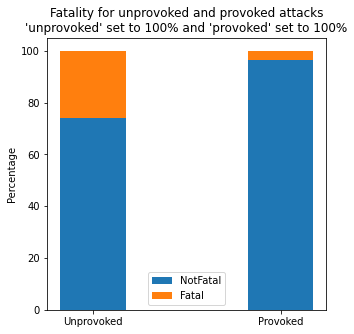

In [ ]:
# grafiek maken
# zie voor stacked barchart:
# https://matplotlib.org/stable/gallery/lines_bars_and_markers/bar_stacked.html

labels = ['Unprovoked', 'Provoked']
not_fatal = [percentage_not_fatal_unprovoked, percentage_not_fatal_provoked]
fatal = [percentage_fatal_unprovoked, percentage_fatal_provoked]
width = 0.35       # the width of the bars: can also be len(x) sequence

fig, ax = plt.subplots()

ax.bar(labels, not_fatal, width, label='NotFatal')
ax.bar(labels, fatal, width, bottom=not_fatal, label='Fatal')

ax.set_ylabel('Percentage')
ax.set_title("Fatality for unprovoked and provoked attacks\n'unprovoked' set to 100% and 'provoked' set to 100%")
ax.legend()

fig.set_size_inches(5,5) # Make chart a little bigger

plt.show()

In [ ]:
# Bovenstaande grafiek zou nog duidelijker zijn als je de unprovoked percentages in een andere grafiek zet dan de provoked percentages
# Dit nog doen dus dan gebruik maken van subplots

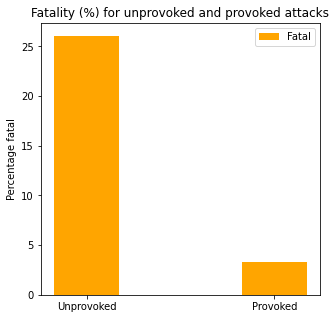

In [ ]:
# Eigenlijk is het nog beter te zien als je alleen het percentage fataliteit per provoked of unprovoked attack geeft
# Dus opnieuw:
labels = ['Unprovoked', 'Provoked']
# not_fatal = [percentage_not_fatal_unprovoked, percentage_not_fatal_provoked]
fatal = [percentage_fatal_unprovoked, percentage_fatal_provoked]
width = 0.35       # the width of the bars: can also be len(x) sequence
c = 'orange'

fig, ax = plt.subplots()

# ax.bar(labels, not_fatal, width, label='NotFatal')
ax.bar(labels, fatal, width, label='Fatal', color = c)

ax.set_ylabel('Percentage fatal')
ax.set_title('Fatality (%) for unprovoked and provoked attacks')
ax.legend()

fig.set_size_inches(5,5) # Make chart a little bigger

plt.show()

# Het liefst wil ik de kleur oranje hebben
# Kijken hoe we dat voor elkaar krijgen
# Gelukt!


In [ ]:
# Wat je eigenlijk ook  nog wilt laten zien zijn de totale percentages van provoked attacks en unprovoked attacks.
# Gewoon voor een overzichtsplaatje
# Daarvoor stellen we het totaal van provoked en unprovoked samen op 100%
# En geven daarna de percentages weer in een grafiek
percentage_total =round((df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3])/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_unprovoked_total = round((df5_2.iloc[3] + df5_2.iloc[2])/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_provoked_total = round((df5_2.iloc[1] + df5_2.iloc[0])/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_unprovoked_fatal_total = round(df5_2.iloc[3]/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_unprovoked_not_fatal_total = round(df5_2.iloc[2]/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_provoked_fatal_total = round(df5_2.iloc[1]/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)
percentage_provoked_not_fatal_total = round(df5_2.iloc[0]/(df5_2.iloc[0] + df5_2.iloc[1] + df5_2.iloc[2] + df5_2.iloc[3]) * 100,3)

print(f'Als het totaal van alle bewezen provoked en unprovoked aanvallen op\n100 % worden gesteld, dan krijg je de volgende percentages:\n')
print(f"Het percentage 'unprovoked' aanvallen bedraagt in totaal {percentage_unprovoked_total}%")
print(f"Het percentage 'provoked' aanvallen bedraagt in totaal {percentage_provoked_total}%\n")
print(f"Het percentage 'unprovoked' aanvallen die niet fataal zijn bedraagt in totaal {percentage_unprovoked_not_fatal_total}%")
print(f"Het percentage 'unprovoked' aanvallen die wel fataal zijn bedraagt in totaal {percentage_unprovoked_fatal_total}%")
print(f"Het percentage 'provoked' aanvallen die niet fataal zijn bedraagt in totaal {percentage_provoked_not_fatal_total}%")
print(f"Het percentage 'provoked' aanvallen die wel fataal zijn bedraagt in totaal {percentage_provoked_fatal_total}%")

Als het totaal van alle bewezen provoked en unprovoked aanvallen op
100 % worden gesteld, dan krijg je de volgende percentages:

Het percentage 'unprovoked' aanvallen bedraagt in totaal 88.863%
Het percentage 'provoked' aanvallen bedraagt in totaal 11.137%

Het percentage 'unprovoked' aanvallen die niet fataal zijn bedraagt in totaal 65.706%
Het percentage 'unprovoked' aanvallen die wel fataal zijn bedraagt in totaal 23.157%
Het percentage 'provoked' aanvallen die niet fataal zijn bedraagt in totaal 10.765%
Het percentage 'provoked' aanvallen die wel fataal zijn bedraagt in totaal 0.373%


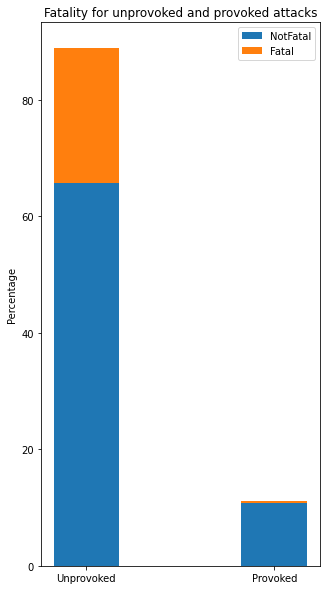

In [ ]:
# Bovenstaande percentages in een barchart om een beter overzicht te hebben:
labels = ['Unprovoked', 'Provoked']
not_fatal = [percentage_unprovoked_not_fatal_total, percentage_provoked_not_fatal_total]
fatal = [percentage_unprovoked_fatal_total, percentage_provoked_fatal_total]
width = 0.35       # the width of the bars: can also be len(x) sequence

fig, ax = plt.subplots()

ax.bar(labels, not_fatal, width, label='NotFatal')
ax.bar(labels, fatal, width, bottom=not_fatal, label='Fatal')

ax.set_ylabel('Percentage')
ax.set_title('Fatality for unprovoked and provoked attacks')
ax.legend()

fig.set_size_inches(5,10) # Make chart a little bigger

plt.show()

# Let op! Het percentage fatal in de provoked kolom is zo klein dat dit bijna niet meer te zien is.

# 4. Are certain activities more likely to result in a shark attack?

## Uitwerking

Eigenlijk is voor deze vraag alleen de kolom 'New_Activity' nodig,  want alles wat in de dataframe staat is al een shark attack. 'New_Activity' is de kolom die gebaseerd is op de kolom 'Activity', waarbij de meer dan 1500 unieke activiteiten worden opgeschoond tot een overzichtelijk aantal.

In [ ]:
# Zie voor het maken van de nieuwe kolom 'New_Activity' vanuit de kolom 'Activity'
# het hoofdstukje: cleanen van de kolom 'Activity'
# Als subhoofdstukje wordt dat daar uitgevoerd

# De kolom 'New_Activity' bekijken:
# display(df3.loc[:,"New_Activity"])
# display(df3.loc[:,"New_Activity"].value_counts)
df3.loc[:,"New_Activity"].value_counts(dropna=False)

surfing            1050
swimming           1027
NaN                 829
Not Sure            725
fishing             547
spaerfishing        377
overboard           230
diving              229
bathing             185
wading              169
standing            129
scuba diving        107
body boarding        70
body surfing         52
kayaking             52
free diving          49
boogie boarding      46
floating             37
treading water       37
rafting              28
walking              26
canoeing             25
paddle surfing       24
rowing               24
kite surfing         21
playing              21
windsurfing          21
sea disaster         21
shark fishing        18
skindiving           15
padde surfing        15
feeding              15
collecting           14
surf fishing         13
washing              13
sailing              12
hunting               9
splashing             8
hookah diving         7
filming               5
Name: New_Activity, dtype: int64

In [ ]:
# Maak een dataframe van de value_counts
df6 = df3['New_Activity'].value_counts().to_frame()
df6

,New_Activity
surfing,1050
swimming,1027
Not Sure,725
fishing,547
spaerfishing,377
overboard,230
diving,229
bathing,185
wading,169
standing,129


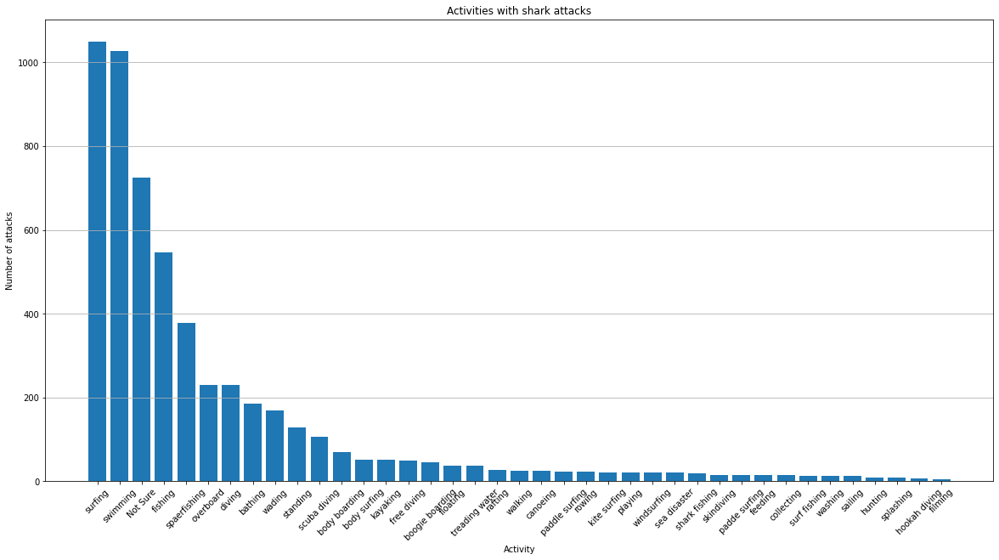

In [ ]:
# Maak er een verticale barchart van

fig, ax = plt.subplots()


activity = df6.index
activity_counts = df6.loc[:,'New_Activity']


ax.bar(activity, activity_counts)

# Make x labels readable
plt.xticks(rotation=45)

# 4. add labels for the x- and y-axis
plt.xlabel("Activity")

plt.ylabel("Number of attacks")

# 5. add a title
plt.title("Activities with shark attacks")


# 6. add horizontal grid lines
ax.grid(True, axis="y")


fig.set_size_inches(20,10) # Make chart a little bigger

plt.show()

In [ ]:
# Maak er een horizontale barchart van, om het plaatje duidelijker te maken
# Dan de volgorde van de 'New_Activity' kolom omdraaien voor een mooier plaatje
# Kan ook met ax.invert_yaxis()!!!!!

# openstaande vraag:
# ⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️
df6.sort_values(by='New_Activity', ascending=False)
# geeft hetzelfde dataframe als:
df6.sort_values(by='New_Activity', ascending=True)
# Waarom???????  Geen idee!!!
df6
# ⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️

,New_Activity
surfing,1050
swimming,1027
Not Sure,725
fishing,547
spaerfishing,377
overboard,230
diving,229
bathing,185
wading,169
standing,129


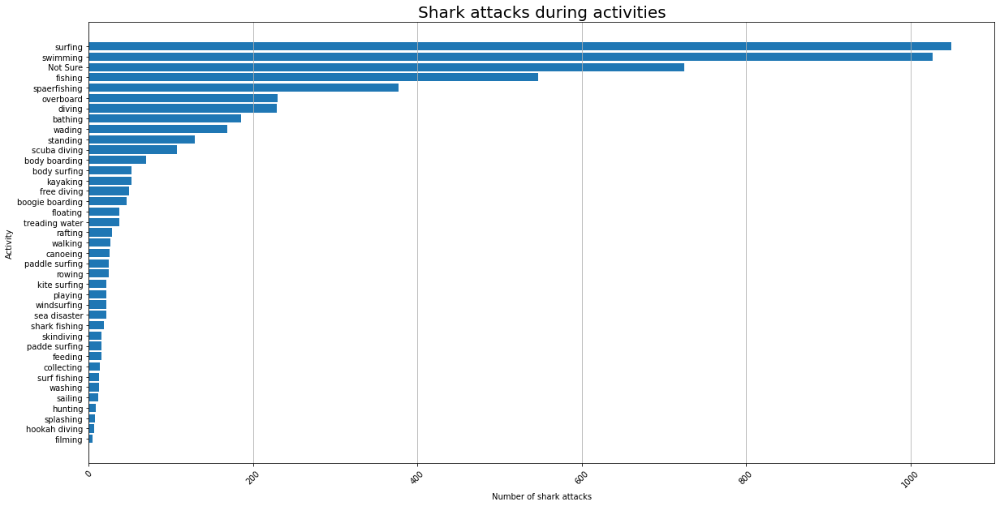

In [ ]:
# Maak er een horizontale barchart van

fig, ax = plt.subplots()


activity = df6.index
activity_counts = df6.loc[:,'New_Activity']


ax.barh(activity, activity_counts)

# Make x labels readable
plt.xticks(rotation=45)

# 4. add labels for the x- and y-axis
plt.xlabel("Number of shark attacks")

plt.ylabel("Activity")

# 5. add a title
# plt.title("Shark attacks during activities")

fontsize = 20
# plt.suptitle("Shark attacks during activities", fontsize=fontsize)
# plt.title("Test", fontdict={'fontsize': fontsize})
# onderstaande kan ook:
plt.title("Shark attacks during activities", fontsize=fontsize)

# 6. add horizontal grid lines
ax.grid(True, axis="x")

ax.invert_yaxis()

fig.set_size_inches(20,10) # Make chart a little bigger

plt.show()

In [ ]:
# Percentage 'Not Sure' uitrekenen na verwijderen missing values:
percentage_not_sure_2  = round((df6.loc['Not Sure', 'New_Activity']/df6.loc[:, 'New_Activity'].sum())* 100,3)
percentage_not_sure_2
print(f'Het percentage "Not Sure" (activiteiten die niet geheel eenduidig zijn)')
print(f'bedraagt {percentage_not_sure_2}% van de toale activiteiten na verwijdering van de null-values')



Het percentage "Not Sure" (activiteiten die niet geheel eenduidig zijn)
bedraagt 13.247% van de toale activiteiten na verwijdering van de null-values


In [ ]:
# Er is voor gekozen de rij 'Not Sure' (bevattende de activiteiten die niet geheel duidelijk zijn) te verwijderen
# Daarna alles omzetten naar percentages
# Waarbij de som van de 'New_Activities' kolom op 100% wordt gesteld
# ⚠️Mag dat zomaar? Je gooit dan wel resultaten weg, voor een inzichtelijk plaatje?
df6_1 = df6.drop('Not Sure')


In [ ]:
# Maak een nieuwe kolom 'Percentage_NA'
sum_row_NA = df6_1.loc[:, 'New_Activity'].sum()
# sum_row_NA
df6_1['Percentage_NA'] = round(((df6_1['New_Activity'])/sum_row_NA)* 100,3)
df6_1

,New_Activity,Percentage_NA
surfing,1050,22.115
swimming,1027,21.630
fishing,547,11.521
spaerfishing,377,7.940
overboard,230,4.844
diving,229,4.823
bathing,185,3.896
wading,169,3.559
standing,129,2.717
scuba diving,107,2.254


## Verantwoording Conclusie:
Voor het beantwoorden van deze vraag is de kolom 'Activity' nodig. Het aantal missing values in die kolom is vrij laag (8,632 %). Na het cleanen blijft het percentage missing values hetzelfde(8,632 %).

Om de vraag te kunnen beantwoorden is een nieuwe kolom gemaakt ('New_Activity'), gebaseerd op de gegevens van de kolom 'Activity', om het grote aantal unieke activiteiten (ongeveer 1500) terug te brengen tot een behapbaar, overzichtelijk aantal.

Er is voor gekozen om alle kolommen die de string 'surf' bevatten om te zetten naar de activiteit 'surfing'. Daarna is gekozen om van de activiteiten binnen het surfen (indien mogelijk) aparte activiteiten te maken. Activiteiten die de string 'surf' bevatten werden nog opgedeeld in meerdere catogorieen, zoals; 'body surfing', 'paddle surfing', 'windsurfing', kite surfing. Ook activiteiten die onder surfen gerekend zouden konden worden, zoals 'body boarding'en 'boogie boarding' kregen een eigen 'Activity'. Mochten er activiteiten zijn die de string 'surf' bevatten en die niet tot de bovenstaande subcatogorieen behoren dan kregen ze op deze manier de activiteit 'surfen'. (Voor 'surf fishing' (kust vissen) geldt dat het onder de activiteit fishing valt, zie daar.)

Hetzelde geldt voor de activiteit 'diving'. 'scuba diving', 'free diving', 'hookah diving' en 'skindiving' worden als aparte activiteit gezien. Valt een duik activiteit niet onder één van deze catogorieën, dan werd het de activiteit 'diving'.

Ook 'spearfishing', 'shark  fishing' en 'surf fishing' werd een aparte activiteit. Alles wat onder fishing valt en geen van bovenstaande drie strings bevat, kreeg de activiteit 'fishing'.

Elke activiteit die de volgende strings ('boat', 'ship', 'overboard', 'fell',  'jump', 'sinking', 'swept, 'capsized', 'sunk', 'torpedoed', 'swept', 'ton', 'USS', 'sank', 'steamer', 'schooner' ) bevatten werden de activiteit 'overboard'.

Om alle gevallen uit te sluiten,  waarbij de activiteit niet helemaal duidelijk was, is er voor gekozen om alle rijen waarin de volgende strings voorkomen ('or', '?', '/' en/of '&') in de nieuwe kolom 'New_Activities' te benoemen als 'Not sure'. Het percentage 'Not sure' dat voorkomt in de kolom 'New-Activity' bedraagt (na verwijderen missing null-values) 13,085%. 

Er is voor gekozen om de rij 'Not Sure' (waarbij de activiteit niet helemaal  duidelijk was) niet mee te nemen in de berekening van het percentage 'shark attacks' per activiteit.

Het aantal missing values in de nieuwe kolom 'New_Activities' bedraagt 13,155%. Dit percentage komt bovenop het percentage missing values dat voorkomt in de kolom 'Activities'
Er is al met al relatief weinig data verloren gegaan bij het maken van de nieuwe kolom.

Houdt wel in de gaten: Onderstaande zijn conclusies die gebaseerd zijn op de gebruikte dataset.

## Conclusie:

Surfen (22.1 %), zwemmen (21,6 %) en vissen (12.5 %) zijn de activiteiten waarbij er de meeste 'shark attacks' plaatsvinden. Wordt de activiteit 'speer vissen' nog onder de activiteit 'vissen' gerekend, dan krijgt die activiteit zelfs een percentage van 20.5 %. In totaal zou (in dat geval) 64 % van de 'shark attacks' veroorzaakt worden door bovenstaande activiteiten.

Vooral als alle mogelijke subcatagorieën voor surfen nog worden meegenomen, dan is surfen de activiteit die de kroon spant bij het percentage 'shark attacks'. (Zie bar chart in volgende cel.)

Er is voor gekozen om de verschillende subcategorieën weer te geven om een zo gedetailleerd mogelijk beeld te geven. Voor een iets simpeler beeld zouden de subcategorieën nog bij de hoofdcategorie betrokken kunnen worden.Er is dan echter altijd nog discussie mogelijk over welke activiteit waar onder zou vallen. (Valt bijvoorbeeld 'body surfing' onder 'swimming' of onder 'surfen')

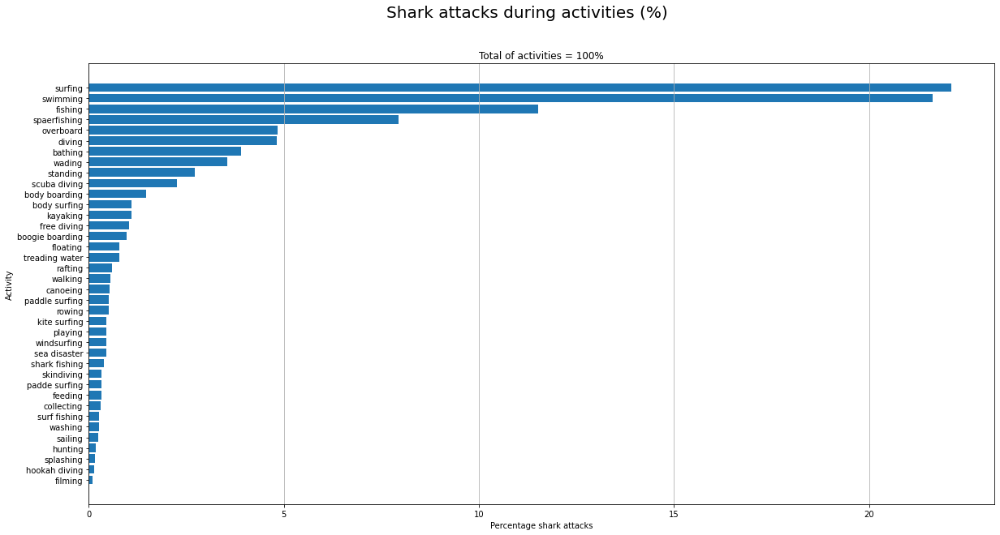

In [ ]:
# Maak er een horizontale barchart van

fig, ax = plt.subplots()

# definieer x-as en y-as
activity = df6_1.index
percentage_NA = df6_1.loc[:,'Percentage_NA']

# maak horizontale bar chart
ax.barh(activity, percentage_NA)

# Make x labels readable
# plt.xticks(rotation=45)

# add labels for the x- and y-axis
plt.xlabel("Percentage shark attacks")
plt.ylabel("Activity")

# add a title
fontsize = 20
plt.suptitle("Shark attacks during activities (%)", fontsize=fontsize)
fontsize2 = 12
plt.title("Total of activities = 100%", fontsize=fontsize2)

# add vertical grid lines
ax.grid(True, axis="x")

# Draai y-as om
ax.invert_yaxis()

fig.set_size_inches(20,10) # Make chart a little bigger

plt.show()